In [1]:
import os
import numpy as np
import itertools
import time
import random
from collections import OrderedDict, Counter, defaultdict
from functools import partial
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

import copy
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split

import math
import json
from typing import Callable, Iterable, Tuple
from torch.optim import Optimizer
from torch.utils.data import WeightedRandomSampler

import wandb
wandb.login()
from pytorch_lightning.loggers import WandbLogger

import collections

wandb: Currently logged in as: chucooleg (use `wandb login --relogin` to force relogin)


## Data -- Generation

In [2]:
def generate_cards(attributes, attr_order, num_attributes, num_attr_vals):
    
    attr_order = attr_order[:num_attributes]
    attributes = {att_k:attributes[att_k][:num_attr_vals] for att_k in attributes if att_k in attr_order}
    
    cards = []
    idx_to_card = {}
    card_to_idx = {}

    i = 0
    attr_vals = [attributes[attr] for attr in attr_order]
    for combo in itertools.product(*attr_vals):
        card = tuple(combo)
        cards.append(card)
        card_to_idx[card] = i
        idx_to_card[i] = card
        i += 1
    
    assert len(cards) == len(set(cards))
    print(f'Generated {len(cards)} unqiue cards')                
    return cards, idx_to_card, card_to_idx


def num_shared_attributes(card1, card2):
    matching_concepts = tuple(s1 if s1==s2 else '-' for s1,s2 in zip(card1,card2))
    num_matching_concepts = len([c for c in matching_concepts if c != '-'])
    return matching_concepts, num_matching_concepts


def generate_card_pairs(cards, card_to_idx):
    '''
    find all combos of cards, filter down to the ones that share concepts.
    '''
    cardpairs_with_shared_concepts = []
    cardpairs_without_shared_concepts = []

    cardpair_to_idx, idx_to_cardpair, idx = {}, {}, 0
    num_matching_concepts_all = {}
    for card1, card2 in itertools.combinations(cards,2):
        if card1 != card2:
            matching_concepts, num_matching_concepts = num_shared_attributes(card1, card2)
            num_matching_concepts_all[(card1, card2)] = num_matching_concepts
            if num_matching_concepts:
                cardpairs_with_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            else:
                cardpairs_without_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            idx_to_cardpair[idx] = (card_to_idx[card1], card_to_idx[card2])
            cardpair_to_idx[(card_to_idx[card1], card_to_idx[card2])] = idx
            idx += 1
    print(f'Generated {len(cardpairs_with_shared_concepts) + len(cardpairs_without_shared_concepts)} cardpairs')
    print(f'-- {len(cardpairs_with_shared_concepts)} cardpairs with shared concept')
    print(f'-- {len(cardpairs_without_shared_concepts)} cardpairs without shared concept')
    print(Counter(num_matching_concepts_all.values()).most_common())
    return cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair


def match_concept_to_card(concept, card):
    '''
    Given a concept, determine if card matches.
    
    Arguments:
        concept: ('red', 'void', '-', '-')
        card: ex1. ('red', 'void', 'triangle', 'XOX')
              ex2. ('green', 'void', 'square', 'OXX')
    Returns:
        match: bool. ex1. True,
                     ex2. False
    '''
    match = 0
    for ct, cd in zip(concept, card):
        # As long as one concept matches, it is a match!
        if ct == cd:
            match += 1
    return match


def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

def gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=100, debug=False):
    
    # all cards
    cards, idx_to_card, card_to_idx = generate_cards(attributes, attr_order, num_attributes, num_attr_vals)
    # all card pairs
    cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair = \
        generate_card_pairs(cards, card_to_idx)
    
    # generate answers
    all_matches = []
    number_of_shared_concepts_per_match = []
    cardpair_to_matches = defaultdict(lambda : defaultdict(int))
#     for cardpair in cardpairs_with_shared_concepts + cardpairs_without_shared_concepts: # NOTE!!
    for cardpair in cardpairs_with_shared_concepts:
        shared_concept = cardpair[1]
        # look for all matching cards
        # ((card pair query), matching card)
        for card in cards:
            num_matched_concepts = match_concept_to_card(shared_concept, card)
            if num_matched_concepts:
                all_matches.append((cardpair_to_idx[cardpair[0]], card_to_idx[card]))
                cardpair_to_matches[cardpair_to_idx[cardpair[0]]][card_to_idx[card]] = num_matched_concepts
                number_of_shared_concepts_per_match.append(num_matched_concepts)
    cardpair_to_matches = default_to_regular(cardpair_to_matches)
    print('Total number of matches = ', len(all_matches))
    print('Number of shared concepts per match = ', Counter(number_of_shared_concepts_per_match).most_common())
    
    # hold out some cardpairs
    unseen_cardpair_indices = list(np.random.choice(len(cardpair_to_idx), size=num_unseen_cardpairs, replace=False))
    train_cardpair_indices = [idx for idx in range(len(cardpair_to_idx)) if idx not in unseen_cardpair_indices]
    assert len(set(unseen_cardpair_indices) | set(train_cardpair_indices)) == len(cardpair_to_idx)
    
    data = {
        'idx_to_key': idx_to_card,
        'key_to_idx': card_to_idx,
        'query_to_idx': cardpair_to_idx, 
        'idx_to_query': idx_to_cardpair,
        'all_matches': all_matches, # list of tuples (query idx, answer card)
        'query_to_keys': cardpair_to_matches, # lookup query idx:{'card1':num matched concepts, 'card2':num matched concepts,...}
        'unseen_query_indices': unseen_cardpair_indices,
        'seen_query_indices': train_cardpair_indices
    }
    return data


attributes = {
    'color': ['red', 'green', 'blue', 'orange', 'cyan', 'magenta', 'black', 'yellow'],
    'fill': ['void', 'dashed', 'solid', 'checkered', 'dotted', 'mosaic', 'noise', 'brushed'],
    'shape': ['square', 'circle', 'triangle', 'star', 'hexagon', 'pentagon', 'ellipse', 'rectangle'],
    'config': ['OOO', 'OOX', 'OXO', 'OXX', 'XOO', 'XOX', 'XXO', 'XXX']
}

attr_order = ['color', 'fill', 'shape', 'config']

num_attributes = 2
num_attr_vals = 7
game_data = gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=0, debug=False)

Generated 49 unqiue cards
Generated 1176 cardpairs
-- 294 cardpairs with shared concept
-- 882 cardpairs without shared concept
[(0, 882), (1, 294)]
Total number of matches =  2058
Number of shared concepts per match =  [(1, 2058)]


## Data -- Distribution, Splits

In [3]:
distribution_epsilon = 1e-100

count_table = np.zeros((len(game_data['idx_to_key']), len(game_data['idx_to_query'])))
        
for q, k in game_data['all_matches']:
    count_table[k, q] += 1    
        
xy = count_table/np.sum(count_table)
xy += distribution_epsilon
xy /= np.sum(xy)

x = np.sum(xy,0)
y = np.sum(xy,1)
xyind = y[None].T @ x[None]

In [4]:
# + 0.1
[(0.0029940119760479044, 270), (0.003548458638278998, 54)]
# + nothing
Counter(list(xy.reshape(-1))).most_common()

[(1e-100, 55566), (0.00048590864917395527, 2058)]

In [5]:
np.sum(count_table)

2058.0

In [6]:
xy_rank = np.linalg.matrix_rank(xy)
print('xy_rank=',xy_rank)

xy_div_xyind_rank = np.linalg.matrix_rank((xy/xyind))
print('xy_div_xyind_rank=',xy_div_xyind_rank)

xy_rank= 13
xy_div_xyind_rank= 13


In [30]:
figsize = (20,15)
# figrange = (fx_s, fx_e, fy_s, fy_e)
# figrange = (0, len(game_data['idx_to_key']), 0, len(game_data['idx_to_query']))
figrange = (0, len(game_data['idx_to_key']), 0, 300)

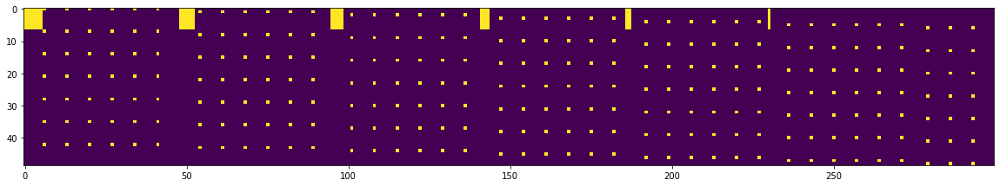

In [31]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

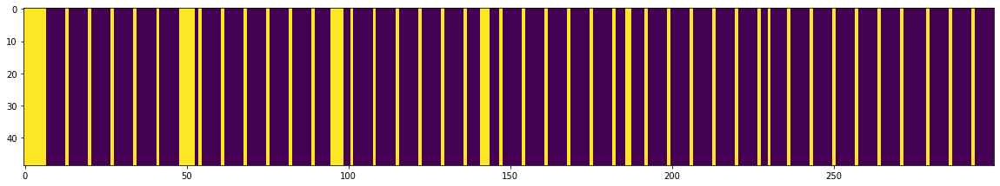

In [32]:
# all
plt.figure(figsize = figsize)
plt.imshow((xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

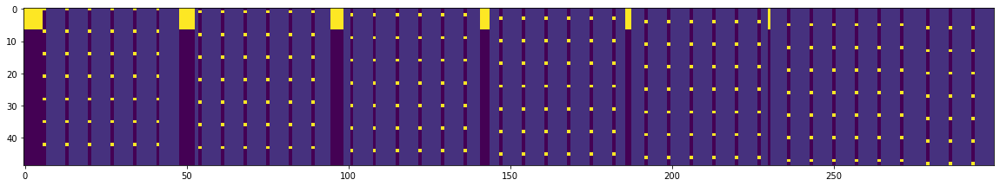

In [33]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

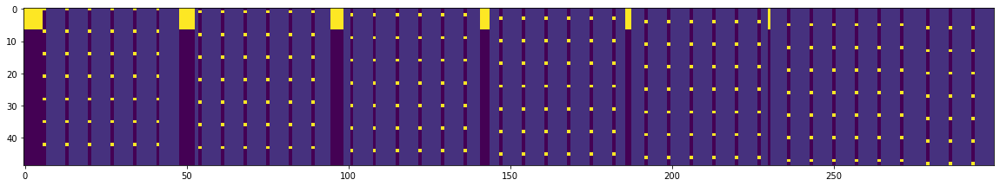

In [34]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [12]:
Counter(list((xy/xyind).reshape(-1))).most_common()

[(0.9999999999999988, 31752),
 (1.4406e-96, 12348),
 (0.9999999999999989, 11466),
 (7.0, 2058)]

## Dataset

In [13]:
### One embed per query!

class GameDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return self.query_support_size * self.key_support_size
    
    def __getitem__(self, idx):
        '''
        key_idx: (xy_i) * (xy.shape[1]=self.query_support_size) + (xy_j)
        '''
        x_i, y_j = idx//self.query_support_size, idx%self.query_support_size
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0
        
        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('key\n', x_i, self.raw_data['idx_to_key'][x_i])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
        
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        )    

game_dataset = GameDataset(raw_data=game_data, debug=True)
game_dataset[10] 
print('-----')
game_dataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'dotted')
key
 0 ('red', 'void')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'dashed')
key
 0 ('red', 'void')
all matches 
 []


(7,
 tensor([7]),
 tensor([0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0]))

In [14]:
class GameTestFullDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        queries_with_shared_attr_only: bool.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return len(self.raw_data['idx_to_query'])
    
    def __getitem__(self, idx):
        '''
        key_idx: int. 0 to query_support_size-1
        '''
        y_j = idx
        x_i = torch.empty(1) # just a meaningless value
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0

        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
            
            
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        ) 
    
game_testdataset = GameTestFullDataset(raw_data=game_data, debug=True)
game_testdataset[10]
print('-----')
game_testdataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'dotted')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'dashed')
all matches 
 []


(7,
 tensor([7]),
 tensor([4709]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0]))

In [15]:
class GameDataModule(pl.LightningDataModule):
    
    def __init__(self, batch_size, raw_data, seen_train_xy, seen_val_xy, debug=False):
        super().__init__()
        self.batch_size = batch_size
        self.dataset = GameDataset(raw_data=raw_data, debug=debug)
#         self.testdataset = GameTestFullDataset(raw_data=raw_data, debug=debug)
        self.seen_train_xy = seen_train_xy
        self.seen_val_xy = seen_val_xy
        self.setup_samplers()
        
    def setup_samplers(self):
        self.train_sampler = WeightedRandomSampler(
            weights=self.seen_train_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        ) 
        self.val_sampler = WeightedRandomSampler(
            weights=self.seen_val_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        )
        
    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train = self.dataset
            self.val = self.dataset
#         if stage == 'test' or stage is None:
#             self.test = self.testdataset
            
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train, batch_size=self.batch_size, shuffle=False, sampler=self.train_sampler
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(
            self.val, batch_size=self.batch_size,  shuffle=False, sampler=self.val_sampler
        )
        return val_loader
    
#     def test_dataloader(self):
#         test_loader = DataLoader(
#             self.test, batch_size=self.batch_size, shuffle=False
#         )
#         return test_loader  

## Model Architecture

In [16]:
def construct_full_model(hparams):
    '''
    return: nn.Module.
    '''
    # embeddings
    query_embed_X = ScaledEmbedding(hparams['query_support_size'], hparams['d_model'])
    key_embed_X = ScaledEmbedding(hparams['key_support_size'], hparams['d_model'])
    embed_dropout = nn.Dropout(hparams['embed_dropout'])
    
    # full model
    model = EncoderPredictor(
        inp_query_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', query_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        inp_key_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', key_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        classifier = nn.Sequential(
            OrderedDict([   
                ('linear1', nn.Linear(2*hparams['d_model'], hparams['d_model'])),
                ('nonLinear1', nn.ReLU()),
                ('linear-out', nn.Linear(hparams['d_model'], 1)),
            ])
        ) if not hparams['dotproduct_bottleneck'] else None, 
        
        key_support_size = hparams['key_support_size'],
        d_model = hparams['d_model'],
        debug = hparams['debug'],
    )
    
    return model

In [17]:
class ScaledEmbedding(nn.Module):

    def __init__(self, V, d_model):
        super(ScaledEmbedding, self).__init__()
        self.embedding = nn.Embedding(V, d_model)
        # scale embedding to have variance 0.01
        nn.init.normal_(self.embedding.weight, mean=0., std=(0.01)**(1/2))
        self.d_model = d_model

    def forward(self, tokens):
        '''
        tokens: shape (batch_size=b, len)
        '''
        # shape (b, len, d_model)
        embedded = self.embedding(tokens) * math.sqrt(self.d_model)
        if torch.max(embedded) > 2000.:
            import pdb; pdb.set_trace()
        return embedded

In [18]:
class EncoderPredictor(nn.Module):
    
    def __init__(self, inp_query_layer, inp_key_layer, classifier, key_support_size, d_model, debug=False):
        super().__init__()
        self.inp_query_layer = inp_query_layer
        self.inp_key_layer = inp_key_layer
        self.classifier = classifier
        self.key_support_size = key_support_size
        self.d_model = d_model
        
    def forward(self, X_query, X_key, val_bool, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1) if test bool, else (b, num matched cards) or None.
        '''
        if X_key is not None: assert X_query.shape == X_key.shape
        if val_bool:
            return self.forward_norm_support(X_query, debug=debug)
        else:
            assert X_key is not None, 'X_key should not be None for normalizing over minibatch keys.'
            return self.forward_norm_minibatch(X_query, X_key, debug=debug)

    def forward_norm_minibatch(self, X_query, X_key, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)
        
        # shape(b, d_model)
        key_repr = self.encode_key(X_key).squeeze(1)
        assert key_repr.shape == (b, self.d_model)

        if self.classifier:
            # shape(b, b, d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, b, self.d_model)
            # shape(b, b, d_model)
            key_repr_tiled = key_repr.unsqueeze(0).expand(b, b, self.d_model)
            # shape(b, b, 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            assert query_key_concat.shape == (b, b, 2*self.d_model)
            # shape(b*b, 2*d_model)
            query_key_concat = query_key_concat.reshape(b*b, 2*self.d_model)
            # shape(b*b, 1)
            logits = self.classifier(query_key_concat)
            assert logits.shape == (b*b, 1)
            # shape(b, b)
            logits = logits.squeeze(1).reshape(b, b)
        else:
            # shape(b, b) dotproduct=logit matrix
            logits = torch.matmul(query_repr, key_repr.T)
        assert logits.shape == (b, b)
        
        # shape(b, b)
        return logits

    def forward_norm_support(self, X_query, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)

        # shape(size(support), d_model)
        keys_repr = self.encode_all_keys()
        assert keys_repr.shape == (self.key_support_size, self.d_model)
        
        if self.classifier:
            # shape(b, size(support), d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), d_model)
            key_repr_tiled = keys_repr.unsqueeze(0).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            # shape(b*size(support), 2*d_model)
            query_key_concat = query_key_concat.reshape(b*self.key_support_size, 2*self.d_model)
            # shape(b*size(support), 1)
            logits = self.classifier(query_key_concat)
            # shape(b, size(support))
            logits = logits.squeeze(1).reshape(b, self.key_support_size)
        else:
            # shape(b, size(support)) dotproduct=logit matrix
            logits = torch.matmul(query_repr, keys_repr.T)
        assert logits.shape == (b, self.key_support_size)
        
        # shape(b, size(support)) 
        return logits

    def encode_query(self, X):
        '''
        X: (batch_size=b,1)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_query_layer(X)
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed     
        
    def encode_key(self, X):
        '''
        X: (batch_size=b)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_key_layer(X) 
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed  

    def encode_all_keys(self):
        
        # shape(size(support), embed_dim)
        all_embed = self.inp_key_layer.scaled_embed.embedding.weight
        assert all_embed.requires_grad == True
        assert all_embed.shape == (self.key_support_size, self.d_model)
        
        return all_embed

## Loss, Metric

In [19]:
class InfoCELoss(nn.Module):
    '''
    InfoCE Loss on a (b, b) logits matrix with Temperature scaling
    '''

    def __init__(self, temperature_const=1.0):
        super().__init__()
        self.temperature_const = temperature_const
        self.CE_loss = nn.CrossEntropyLoss(reduction='sum')

    def forward(self, logits, debug=False):
        '''
        logits: shape (batch_size=b, b)
        '''
        assert logits.shape[0] == logits.shape[1]
        b = logits.shape[0]
        
        logits /= self.temperature_const
        
        labels = torch.arange(b).type_as(logits).long()
        sum_loss_per_row = self.CE_loss(logits, labels)
        sum_loss_per_col = self.CE_loss(logits.T, labels)
        
        if debug:
            print('sum_loss_per_row=',sum_loss_per_row)
            print('sum_loss_per_col=',sum_loss_per_col)

        loss = (sum_loss_per_row + sum_loss_per_col) * 0.5
        return loss


# ---------------------------    
loss_criterion = InfoCELoss(temperature_const=0.1)

logits = torch.tensor([
    [1.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))
print('-------------')
logits = torch.tensor([
    [3.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))


# ref
# sum_loss_per_row= tensor(20.0001)
# sum_loss_per_col= tensor(60.0001)
# avg loss= tensor(40.0001)
# -------------
# sum_loss_per_row= tensor(0.6933)
# sum_loss_per_col= tensor(40.0001)
# avg loss= tensor(20.3467)

sum_loss_per_row= tensor(20.0001)
sum_loss_per_col= tensor(60.0001)
avg loss= tensor(40.0001)
-------------
sum_loss_per_row= tensor(0.6933)
sum_loss_per_col= tensor(40.0001)
avg loss= tensor(20.3467)


In [20]:
class ThresholdedMetrics(nn.Module):
    
    def __init__(self, raw_data):
        '''
        tot_k: total number of candidates. e.g. 81 cards
        '''
        super().__init__()
        self.raw_data = raw_data
        self.key_support_size = len(self.raw_data['idx_to_key'])
        self.threshold = 1.0 / (self.key_support_size)
        self.softmax = nn.Softmax(dim=1)

    def breakdown_errors(self, X_query, corrects):
        '''
        X_query: shape (b,1) (if one embed per query)
        corrects: shape (b, support size)
        '''
        b = X_query.shape[0]
        assert corrects.shape == (b, self.key_support_size)
        
        X_query_list = X_query.squeeze(-1)
        wrongs = (1 - corrects).cpu().numpy()
        
        num_matched_concepts = [
             self.raw_data['query_to_keys'].get(X_query_list[batch_i].item(), {}).get(card_idx, 0)
            for batch_i in range(b) for card_idx in range(self.key_support_size)  
        ]
        
        num_matched_concepts = np.array(num_matched_concepts).reshape(b, self.key_support_size)
        assert num_matched_concepts.shape == wrongs.shape
        
        wrongs_mask = wrongs.reshape(-1).tolist()
        num_matched_concepts = num_matched_concepts.reshape(-1).tolist()

        error_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        total_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        for w,k in zip(wrongs_mask, num_matched_concepts):
            if w == 1:
                error_count_by_num_matched_concepts[k] += 1
            total_count_by_num_matched_concepts[k] += 1    

        error_counts, total_counts = {}, {}
        for k in range(num_attributes):
            err_ct = error_count_by_num_matched_concepts[k]
            tot_ct = total_count_by_num_matched_concepts[k]
            error_counts[f'error_rate_for_{k}_matched_concepts'] = 0 if tot_ct == 0 else (err_ct *1.0 / tot_ct)
            total_counts[f'total_count_for_{k}_matched_concepts'] = tot_ct

        return {**error_counts, **total_counts}    
    
    def forward(self, X_query, logits, X_keys, full_test_bool=False, breakdown_errors_bool=False, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        b, key_support_size = logits.shape
        assert key_support_size == self.key_support_size
        assert logits.shape == X_keys.shape
        
        if full_test_bool:
            # filter down to query cards with >0 true matches
            queryIdxs_with_nonzero_matches = list(self.raw_data['query_to_keys'].keys())
            X_query_flat = X_query.squeeze(-1)
            fil = torch.stack([(X_query_flat == qId) for qId in queryIdxs_with_nonzero_matches], dim=1).any(dim=1)
            assert fil.shape == (b, )
            
            # queries with shared attributes
            fil_metrics = self.compute_metrics(X_query[fil], logits[fil], X_keys[fil], breakdown_errors_bool, debug)
            fil_metrics = {'nonNullQueries_'+k:fil_metrics[k] for k in fil_metrics}
            
            # queries without shared attributes
            not_fil = torch.logical_not(fil)
            not_fil_metrics = self.compute_metrics(X_query[not_fil], logits[not_fil], X_keys[not_fil], breakdown_errors_bool, debug)
            not_fil_metrics = {'NullQueries_'+k:not_fil_metrics[k] for k in not_fil_metrics}
            
            # all queries
            all_metrics = self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
            
            return {**fil_metrics, **not_fil_metrics, **all_metrics}
        else:
            return self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
    
    def compute_metrics(self, X_query, logits, X_keys, breakdown_errors_bool=False, debug=False):
        '''
        X_query: shape (b,1) (if one embed per query)
        logits: shape (b, support size)
        X_keys: shape (b, support size). value 1.0 at where card matches. value 0 otherwise.
        '''
        b, key_support_size = logits.shape
        
        # model predictions, shape (b, support size)
        binary_predictions = (self.softmax(logits) >= self.threshold).type(torch.float)
        # ground truth, shape (b, support size)
        gt = X_keys
        # correct predictions, shape (b, support size)
        corrects = (binary_predictions == gt).type(torch.float)
        
        # accuracy, computed per query, average across queries
        # (b,)
        accuracy_row = torch.sum(corrects, dim=1) / key_support_size
        # scalar
        accuracy_meanrows = torch.mean(accuracy_row)
        # accuracy, computed per query-key, average across all
        accuracy_all = torch.sum(corrects) / (b * key_support_size)
        
        # precision, computed per query, average across queries
        # (b,)
        precision_row = torch.sum((corrects * binary_predictions), dim=1) / torch.sum(binary_predictions, dim=1)
        # scalar
        precision_meanrows = torch.mean(precision_row)
        # precision, computed per query-key, average across all
        precision_all = torch.sum((corrects * binary_predictions)) / torch.sum(binary_predictions)

        # recall, computed per query, average across queries
        # (b,)
        recall_row = torch.sum((corrects * gt), dim=1) / torch.sum(gt, dim=1)
        # scalar
        recall_meanrows = torch.mean(recall_row)
        # recall, computed per query-key, average across all
        recall_all = torch.sum((corrects * gt)) / torch.sum(gt)
        
        # f1, computed per query, average across queries
        # (b,)
        f1_row = 2 * (precision_row * recall_row) / (precision_row + recall_row)
        # scalar
        f1_meanrows = torch.mean(f1_row)
        # f1, computed per query-key, average across all
        f1_all = (precision_all * recall_all) / (precision_all + recall_all)
        
        if breakdown_errors_bool:
            error_breakdown_by_num_matched_concepts = self.breakdown_errors(X_query, corrects)
        else:
            error_breakdown_by_num_matched_concepts = {} 
            
        if debug:
            print('####################################################')
            print('Metrics Per Query:')
            print('accuracy_rows', accuracy_row)
            print('precision_row', precision_row)
            print('recall_row', recall_row)
            print('f1_row', f1_row)
            print('####################################################')
            print('Metrics Averaged Across Queries')
            print('accuracy_meanrows', accuracy_meanrows)
            print('precision_meanrows', precision_meanrows)
            print('recall_meanrows', recall_meanrows)
            print('f1_meanrows', f1_meanrows)
            print('####################################################')
            print('Metrics Averaged Across All Query-Key Pairs:')
            print('accuracy_all', accuracy_all)
            print('precision_all', precision_all)
            print('recall_all', recall_all)
            print('f1_all', f1_all)
            print('####################################################')
            print('error_breakdown', error_breakdown_by_num_matched_concepts)
            
        metrics = {
            'accuracy_by_Query': accuracy_meanrows,
            'precision_by_Query': precision_meanrows,
            'recall_by_Query': recall_meanrows,
            'f1_by_Query': f1_meanrows,
            'accuracy_by_QueryKey': accuracy_all,
            'precision_by_QueryKey': precision_all,
            'recall_by_QueryKey': recall_all,
            'f1_by_QueryKey': f1_all
        }
        metrics = {
            **metrics, **error_breakdown_by_num_matched_concepts
        }
        return metrics


def test_metric_module():
    key_support_size=3
    thresh=1./key_support_size

    m_f = ThresholdedMetrics(raw_data=game_data)
    m_f.key_support_size = 3

    logits = torch.tensor(
        [
            [thresh, thresh, thresh],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    print('----------------------------------------------')
    
    logits = torch.tensor(
        [
            [0.4, 0.2, 0.4],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    
    
# test_metric_module()

# reference output
# accuracy_row tensor([0.3333, 0.3333, 1.0000])
# precision_row tensor([0.3333, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.5000, 0.5000, 1.0000])
# {'accuracy': tensor(0.5556), 'precision': tensor(0.5556), 'recall': tensor(1.), 'f1': tensor(0.6667)}
# ----------------------------------------------
# accuracy_row tensor([0.6667, 0.3333, 1.0000])
# precision_row tensor([0.5000, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.6667, 0.5000, 1.0000])
# {'accuracy': tensor(0.6667), 'precision': tensor(0.6111), 'recall': tensor(1.), 'f1': tensor(0.7222)}

## Training Module

In [21]:
# Build Lightning Module
# https://colab.research.google.com/drive/1F_RNcHzTfFuQf-LeKvSlud6x7jXYkG31#scrollTo=UIXLW8CO-W8w

thresholded_metrics = ThresholdedMetrics(raw_data=game_data)

class TrainModule(pl.LightningModule):
    
    def __init__(self, hparams, gt_distributions):
        '''
        hparams: dictionary of hyperparams
        gt_distributions: dictionary that stores the groundtruth 'xy', 'xyind' distributions.
                         each is a key_support_size by query_support_size matrix that sums up to 1.0
        '''
        super().__init__()
        self.hparams = hparams
        self.debug = hparams['debug']
        self.save_hyperparameters()
        
        self.model = construct_full_model(hparams)
        self.loss_criterion = InfoCELoss(temperature_const=self.hparams['loss_temperature_const'])
        self.metrics = thresholded_metrics

        self.key_support_size = self.hparams['key_support_size']
        self.query_support_size = self.hparams['query_support_size']
        
        # for pulling model p(x,y) and p(x,y)/[pxpy]
        self.populate_logits_matrix = hparams['populate_logits_matrix']
        if self.populate_logits_matrix:
            self.register_buffer(
                name='model_logits_matrix',
                tensor= torch.zeros(hparams['key_support_size'], hparams['query_support_size'])
            )
            self.setup_gt_distributions(gt_distributions)
        
    def log_metrics(self, metrics_dict):
        for k, v in metrics_dict.items():
            self.log(k, v)
            
    def get_max_memory_alloc(self):
        devices_max_memory_alloc = {}
        for i in range(torch.cuda.device_count()):
            device = torch.device(f'cuda:{i}')
            devices_max_memory_alloc[device] = torch.cuda.max_memory_allocated(device) / 1e6
            torch.cuda.reset_max_memory_allocated(device)
        return devices_max_memory_alloc
    
    ###################################################
    
    def forward(self, X_query, X_key, X_keys, val_bool, full_test_bool=False, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1)
        X_keys: (b, key_support_size) 1s and 0s.
        test_bool: boolean.
        '''
        batch_size = X_query.shape[0]
        
        # ToDo batch_size_b
        
        # shape (b,support) if test_bool else (b, b)
        logits = self.model(X_query, X_key, val_bool, debug=debug)
        # scalar
        loss = None if val_bool else self.loss_criterion(logits, debug=debug)
        # scalar
        metrics = self.metrics(
            logits=logits, X_keys=X_keys, X_query=X_query, 
            debug=debug, full_test_bool=full_test_bool, breakdown_errors_bool=True, 
        ) if val_bool else None

        return logits, loss, metrics
    
    ###################################################
    
    def setup_gt_distributions(self, gt_distributions):
        '''called once during init to setup groundtruth distributions'''
        assert gt_distributions['xy'].shape == gt_distributions['xyind'].shape
        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy',
            tensor= torch.tensor(gt_distributions['xy'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xyind',
            tensor= torch.tensor(gt_distributions['xyind'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy_div_xyind',
            tensor= self.gt_xy/self.gt_xyind
        )
        # scalar
        self.register_buffer(
            name='one',
            tensor= torch.tensor([1.0])
        )   
        # scalar
        self.register_buffer(
            name='gt_mi',
            tensor= self.compute_mutual_information(self.gt_xy, self.gt_xy_div_xyind)
        ) 
   
    
    def populate_model_logits_matrix(self, query_idx, logits):
        '''
        query_idx: shape (b,)
        logits: shape(b, key_support_size)
        '''  
        assert query_idx.shape[0] == logits.shape[0]
        b = query_idx.shape[0]
        assert logits.shape[1] == self.key_support_size
        for i in range(b):
            self.model_logits_matrix[:,query_idx[i]] = logits[i]
    
    def compute_mutual_information(self, xy, xy_div_xyind):
        '''
        xy: p(xy). shape(b, key_support_size)
        xy_div_xyind_hat: p(xy)/[p(x)(y)].
                          shape(b, key_support_size)
        '''
        assert torch.isclose(torch.sum(xy), self.one.type_as(xy))
        assert xy.shape == xy_div_xyind.shape == (
            self.key_support_size, self.query_support_size
        )
        pmi = torch.log(xy_div_xyind)
        mi = torch.sum(xy * pmi)
        return mi
    
    def pull_model_distribution(self, debug=True):

        # sanity check
        sum_logits = torch.sum(self.model_logits_matrix)
        assert sum_logits != 0.0
        
        if debug:
            print('Sum of model logits matrix\n', sum_logits)
            print('Number of model logits with zero value\n', torch.sum(self.model_logits_matrix == 0.0)) 
            print('Variance of model logits\n', torch.var(self.model_logits_matrix))
        
        # estimate the full distribution
        # hat( k * pxy/(pxpy)
        f = torch.exp(self.model_logits_matrix)
        # hat( k * pxy)
        xy_hat = f * self.gt_xyind
        # hat( pxy)
        xy_hat = (xy_hat / torch.sum(xy_hat))
        
        # estimate exp(pmi)
        # hat(k)
        k_hat = torch.sum(f) / torch.sum(self.gt_xy_div_xyind)
        # hat(pxy/(pxpy)
        xy_div_xyind_hat = (f / k_hat)
        if torch.any(torch.isnan(xy_div_xyind_hat)):
            import pdb; pdb.set_trace()
        
        # estimate MI
        # scalar
        mi_hat = self.compute_mutual_information(xy_hat, xy_div_xyind_hat)
        # scalar
        mi_gt_minus_hat = self.gt_mi - mi_hat
        
        # estimate KL divergence
        kl_div_val = F.kl_div(torch.log(xy_hat), self.gt_xy)

        # estimate ranks
        xy_hat = xy_hat.detach().cpu().numpy()
        xy_div_xyind_hat = xy_div_xyind_hat.detach().cpu().numpy()
        # hat(pxy rank)
        xy_hat_rank = np.linalg.matrix_rank(xy_hat)
        # hat(pxy/(pxpy rank)
        xy_div_xyind_hat_rank = np.linalg.matrix_rank(xy_div_xyind_hat) 
        
        pulled_distribution_results = {
            'xy_hat':xy_hat,
            'xy_div_xyind_hat':xy_div_xyind_hat,
            'xy_hat_rank':xy_hat_rank,
            'xy_div_xyind_hat_rank':xy_div_xyind_hat_rank,
            'mi_hat':mi_hat,
            'mi_gt_minus_hat':mi_gt_minus_hat,
            'kl_div':kl_div_val
        }
        
        return pulled_distribution_results

    ###################################################
    
    def training_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        # scalar
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        # dict
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('train step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\nX_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:\n', [(m,metrics[m]) for m in metrics]
            )
        
        # log
        step_metrics = {**{'train_loss': loss}, **{'train_'+m:metrics[m] for m in metrics}}
        self.log_metrics(step_metrics)
        return loss
    
    def validation_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('validation step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\X_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:', [(m,metrics[m]) for m in metrics]
            )
            
        # log 
        step_metrics = {**{'val_loss': loss}, **{'val_'+m:metrics[m] for m in metrics}}
        devices_max_memory_alloc = self.get_max_memory_alloc()
        for device, val in devices_max_memory_alloc.items():
            step_metrics[f'step_max_memory_alloc_cuda:{device}'] = val
        self.log_metrics(step_metrics)
        return step_metrics
    
    def test_step(self, batch, batch_nb):
        
        # (b,1), (b,1), _, (b, support size)
        query_idx, X_query, _, X_keys = batch
        
        # compute scores for all keys
        # shape(b, key_support_size), _, dictionary
        logits, _, metrics = self(X_query, None, X_keys, val_bool=True, full_test_bool=True, debug=self.debug)
        
        if self.populate_logits_matrix:
            self.populate_model_logits_matrix(query_idx, logits)
        
        # log
        step_metrics = {'test_'+m:metrics[m] for m in metrics}
        self.log_metrics(step_metrics)
        return step_metrics 
    
    ###################################################
    
    def aggregate_metrics_at_epoch_end(self, outputs):
        # log metrics
        epoch_metrics = {}
        metric_names = outputs[0].keys()
        for m in metric_names:
            if not ('max_memory_alloc_cuda' in m or 'count' in m or 'rate' in m):
                epoch_metrics['avg_'+m] = torch.stack([x[m] for x in outputs]).mean()
            elif '_matched_concepts' in m:
                epoch_metrics['avg_'+m] = np.mean([x[m] for x in outputs])
        self.log_metrics(epoch_metrics)
        return epoch_metrics         
    
    def validation_epoch_end(self, outputs):
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        return averaged_metrics
    
    def test_epoch_end(self, outputs):        
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        try:
            assert 'avg_test_error_rate_for_1_matched_concepts' in averaged_metrics
        except:
            import pdb; pdb.set_trace()
            
        return averaged_metrics
    
    ###################################################
    
    def configure_optimizers(self):
        opt = torch.optim.Adam(
            params=self.model.parameters(),
            lr=self.hparams['lr'],
            betas=(
                self.hparams['adam_beta1'], self.hparams['adam_beta2']),
            eps=self.hparams['adam_epsilon'],
            weight_decay=self.hparams['adam_weight_decay']
        )
        return opt

## hparams, init train module

In [22]:
# W&B References
# https://docs.wandb.com/library/integrations/lightning
# colab example
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch-lightning/Supercharge_your_Training_with_Pytorch_Lightning_%2B_Weights_%26_Biases.ipynb
# step by step guide
# https://wandb.ai/cayush/pytorchlightning/reports/Use-Pytorch-Lightning-with-Weights-Biases--Vmlldzo2NjQ1Mw


# Distributed Weighted Sampler
# https://discuss.pytorch.org/t/how-to-use-my-own-sampler-when-i-already-use-distributedsampler/62143/8
# https://github.com/PyTorchLightning/pytorch-lightning/discussions/3716#discussioncomment-238296

# torch lightning -- how sampler is added or removed
# https://pytorch-lightning.readthedocs.io/en/stable/multi_gpu.html?highlight=sampler#remove-samplers


hparams = {
    # game difficulty
    'num_attributes': num_attributes,
    'num_attr_vals': num_attr_vals,
    # distribution
    'distribution_epsilon': distribution_epsilon,
    'xy_size': xy.shape,
    # 
    'batch_size': 128,
    # Arch
    'key_support_size': len(game_data['idx_to_key']),
    'query_support_size': len(game_data['idx_to_query']),
    # embedding
    'd_model': 128,
    'embed_dropout': 0.0,
    # final prediction
    'dotproduct_bottleneck':False,
    # loss
    'loss_temperature_const': 1.0,
    # optimizer
    'lr': 0.001,
    'adam_beta1': 0.9,
    'adam_beta2': 0.999,
    'adam_epsilon': 1e-08,
    'warmup_steps': 12000,
    'adam_weight_decay':0,
    'gradient_clip_val': 0,
    # others
    'debug':False,
    'populate_logits_matrix': True
}

pl.seed_everything(42)

# model
trainmodule =  TrainModule(hparams, gt_distributions={'xy':xy, 'xyind':xyind})# , raw_data=game_data)
model_summary = pl.core.memory.ModelSummary(trainmodule, mode='full')
print(model_summary,'\n')

# data
game_datamodule = GameDataModule(
    batch_size = hparams['batch_size'],
    raw_data = game_data,
    seen_train_xy = xy,
    seen_val_xy = xy,
    debug=hparams['debug']
)

# logger
run_name = 'CardGame:OR;attr{}-val{};epsilon{};d_model{};params{}K'.format(num_attributes, num_attr_vals, str(distribution_epsilon), hparams['d_model'], round(max(model_summary.param_nums)/1000,2))
project_name = 'ContrastiveLearning-cardgame-Scaling'
wd_logger = WandbLogger(name=run_name, project=project_name)
print('RUN NAME :\n', run_name)
# check point path
ckpt_dir_PATH = os.path.join('checkpoints', project_name, run_name)

Global seed set to 42


   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 189 K 
1  | model.inp_query_layer                        | Sequential         | 150 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 150 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 150 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 6.3 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 6.3 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 6.3 K 
8  | model.classifier                             | Sequential         | 33.0 K
9  | model.classifier.linear1                     | Linear             | 32.9 K
10 | model.classifier.nonLinear1  

## Run Training

In [23]:
# checkpoints
os.makedirs(ckpt_dir_PATH, exist_ok=True)
checkpoint_callback = ModelCheckpoint(
    monitor='avg_val_accuracy_by_Query',
    dirpath=ckpt_dir_PATH,
    filename='{epoch:02d}-{val_loss:.2f}',
    save_top_k=6,
    save_last=True,
    mode='max',
)

# trainer
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=60000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

#fit
with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
<ipython-input-23-e10bd6447acb>:26: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with torch.autograd.detect_anomaly():


wandb: WARNING Serializing object of type ndarray that is 461104 bytes
wandb: WARNING Serializing object of type ndarray that is 461104 bytes

   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 189 K 
1  | model.inp_query_layer                        | Sequential         | 150 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 150 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 150 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 6.3 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 6.3 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 6.3 K 
8  | model.classifier                             |

Validation sanity check:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 0:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=623, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 0: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=623, v_num=ofpi]
                                                 

/home/user/miniconda/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The validation_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 1:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=623, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=622, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3:  50%|█████     | 1/2 [00:00<00:00, 12.08it/s, loss=622, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4:  50%|█████     | 1/2 [00:00<00:00, 11.89it/s, loss=621, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=621, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=621, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=621, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8:  50%|█████     | 1/2 [00:00<00:00, 12.06it/s, loss=620, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=620, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10:  50%|█████     | 1

Epoch 44:  50%|█████     | 1/2 [00:00<00:00, 12.18it/s, loss=600, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=599, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=598, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47:  50%|█████     | 1/2 [00:00<00:00, 12.02it/s, loss=598, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=597, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=596, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=595, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=593, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=592, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53:  50%|████

Epoch 87:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=508, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 88:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=505, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 89:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=502, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 90:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=499, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 91:  50%|█████     | 1/2 [00:00<00:00, 11.74it/s, loss=496, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 92:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=493, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 93:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=490, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 94:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=488, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 95:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=485, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 96:  50%|████

Epoch 130:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=419, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 131:  50%|█████     | 1/2 [00:00<00:00, 12.16it/s, loss=418, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 132:  50%|█████     | 1/2 [00:00<00:00, 12.05it/s, loss=416, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 133:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=416, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 134:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=415, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 135:  50%|█████     | 1/2 [00:00<00:00, 11.86it/s, loss=414, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 136:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=413, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 137:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=412, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 138:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=411, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 139:

Epoch 172:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 173:  50%|█████     | 1/2 [00:00<00:00, 12.03it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 174:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 175:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 176:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 177:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 178: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 179:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=400, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 180:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=399, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 181:

Epoch 215:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=395, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 216:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=395, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 217:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 218:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 219:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 220: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 221:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 222:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 223:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 224:

Epoch 257:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 258:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 259:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 260:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 261:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 262:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 263:  50%|█████     | 1/2 [00:00<00:00, 12.24it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 264:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=393, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 265:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=394, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 266:

Epoch 300:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 301:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 302:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 303:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 304:  50%|█████     | 1/2 [00:00<00:00, 11.81it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 305:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=392, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 306:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=392, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 307:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=391, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 308:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=390, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 309:

Epoch 342:  50%|█████     | 1/2 [00:00<00:00, 12.28it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 343:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 344:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 345:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 346:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 347:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 348:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 349: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 350:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 351:

Epoch 385:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 386:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 387:  50%|█████     | 1/2 [00:00<00:00, 12.02it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 388: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 389:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 390:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 391:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 392:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 393:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=389, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 394:

Epoch 427:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 428:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 429:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 430:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 431:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 432:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 433:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 434:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 435: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 436:

Epoch 470:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 471:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 472:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 473:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 474:  50%|█████     | 1/2 [00:00<00:00, 12.23it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 475:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 476:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 477:  50%|█████     | 1/2 [00:00<00:00, 12.06it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 478:  50%|█████     | 1/2 [00:00<00:00, 12.11it/s, loss=388, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 479:

Epoch 512:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 513:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 514:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 515:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 516: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 517:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 518:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 519:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 520:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 521:

Epoch 555:  50%|█████     | 1/2 [00:00<00:00, 11.86it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 556:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 557:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 558:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 559:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 560:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=387, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 561:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 562:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 563:  50%|█████     | 1/2 [00:00<00:00, 12.47it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 564:

Epoch 597:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 598:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 599: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 600:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 601: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 602:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 603:  50%|█████     | 1/2 [00:00<00:00, 11.74it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 604:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 605:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 606:

Epoch 640:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 641:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 642:  50%|█████     | 1/2 [00:00<00:00, 12.11it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 643:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 644:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 645:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 646:  50%|█████     | 1/2 [00:00<00:00, 12.11it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 647:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 648:  50%|█████     | 1/2 [00:00<00:00, 12.33it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 649:

Epoch 682:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 683:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 684:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 685:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 686:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 687:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 688:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 689:  50%|█████     | 1/2 [00:00<00:00, 11.78it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 690:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=386, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 691:

Epoch 725:  50%|█████     | 1/2 [00:00<00:00, 12.03it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 726:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 727:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 728:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 729:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 730:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 731:  50%|█████     | 1/2 [00:00<00:00, 11.94it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 732:  50%|█████     | 1/2 [00:00<00:00, 12.03it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 733:  50%|█████     | 1/2 [00:00<00:00, 11.86it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 734:

Epoch 767:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 768:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 769:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 770:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 771:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 772:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 773:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 774:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 775:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 776:

Epoch 810:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 811:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 812:  50%|█████     | 1/2 [00:00<00:00, 12.19it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 813:  50%|█████     | 1/2 [00:00<00:00, 12.16it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 814:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 815:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 816:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 817:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 818:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 819:

Epoch 852:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 853:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 854:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 855:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 856:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 857:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 858:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 859:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 860: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 861:

Epoch 895:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 896:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 897:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 898:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 899: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 900:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 901:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 902: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 903:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=385, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 904:

Epoch 937:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 938:  50%|█████     | 1/2 [00:00<00:00, 12.09it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 939:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 940:  50%|█████     | 1/2 [00:00<00:00, 12.16it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 941:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 942:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 943:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 944:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 945:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 946:

Epoch 980:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 981:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 982:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 983:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 984:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 985:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 986:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 987:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 988:  50%|█████     | 1/2 [00:00<00:00, 12.11it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 989:

Epoch 1022:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1023:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1024:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1025:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1026:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1027:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1028:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1029:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1030:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1064: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1065:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1066:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1067:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1068:  50%|█████     | 1/2 [00:00<00:00, 12.15it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1069:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1070:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1071:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1072:  50%|█████     | 1/2 [00:00<00:00, 11.88it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1106:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1107:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1108:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1109:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1110:  50%|█████     | 1/2 [00:00<00:00, 12.37it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1111:  50%|█████     | 1/2 [00:00<00:00, 12.20it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1112:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1113:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1114:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1148:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1149: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1150:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1151:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1152:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1153:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1154:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1155:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1156:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1190:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1191:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1192:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1193:  50%|█████     | 1/2 [00:00<00:00, 12.19it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1194:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1195:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1196:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1197:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1198:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=384, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1232:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1233:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1234:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1235:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1236:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1237:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1238: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1239:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1240:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1274:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1275:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1276: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1277:  50%|█████     | 1/2 [00:00<00:00, 12.52it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1278:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1279:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1280:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1281:  50%|█████     | 1/2 [00:00<00:00, 12.14it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1282:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1316:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1317:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1318:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1319:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1320:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1321:  50%|█████     | 1/2 [00:00<00:00, 12.14it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1322:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1323:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1324:  50%|█████     | 1/2 [00:00<00:00, 12.20it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1358:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1359:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1360:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1361:  50%|█████     | 1/2 [00:00<00:00, 11.90it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1362:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1363:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1364:  50%|█████     | 1/2 [00:00<00:00, 12.06it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1365:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1366:  50%|█████     | 1/2 [00:00<00:00, 12.41it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1400:  50%|█████     | 1/2 [00:00<00:00, 12.63it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1401:  50%|█████     | 1/2 [00:00<00:00, 12.15it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1402:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1403:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1404:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1405:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1406:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1407:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1408:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1442:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1443:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1444:  50%|█████     | 1/2 [00:00<00:00, 11.74it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1445:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1446:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1447:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1448:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1449: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1450: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1484:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1485:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1486:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1487:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1488:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1489:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1490: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1491:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1492: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1526:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1527:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1528:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1529:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1530: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1531:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1532:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1533:  50%|█████     | 1/2 [00:00<00:00, 12.46it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1534:  50%|█████     | 1/2 [00:00<00:00, 12.18it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1568:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1569:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1570:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1571:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1572:  50%|█████     | 1/2 [00:00<00:00, 11.83it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1573:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1574: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1575:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1576:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1610:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1611:  50%|█████     | 1/2 [00:00<00:00, 12.04it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1612:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1613:  50%|█████     | 1/2 [00:00<00:00, 12.31it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1614:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1615:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1616:  50%|█████     | 1/2 [00:00<00:00, 11.88it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1617:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1618:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1652:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1653:  50%|█████     | 1/2 [00:00<00:00, 11.94it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1654:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1655:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1656:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1657:  50%|█████     | 1/2 [00:00<00:00, 11.97it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1658:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1659:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1660:  50%|█████     | 1/2 [00:00<00:00, 12.03it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1694:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1695:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1696:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1697:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1698:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1699: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1700:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1701:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1702:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1736:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1737:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1738:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1739:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1740:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1741:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1742:  50%|█████     | 1/2 [00:00<00:00, 12.15it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1743:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1744:  50%|█████     | 1/2 [00:00<00:00, 11.90it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1778:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1779:  50%|█████     | 1/2 [00:00<00:00, 11.97it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1780:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1781:  50%|█████     | 1/2 [00:00<00:00, 12.18it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1782:  50%|█████     | 1/2 [00:00<00:00, 11.78it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1783:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1784:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1785:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1786:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1820:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1821: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1822:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1823:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1824:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1825:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1826:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1827:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1828:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1862:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1863:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1864:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1865:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1866:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1867:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1868:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1869:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1870:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1904:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1905:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1906:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1907:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1908:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1909:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1910:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1911:  50%|█████     | 1/2 [00:00<00:00, 12.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1912:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1946:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1947:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1948:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1949: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1950:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1951:  50%|█████     | 1/2 [00:00<00:00, 12.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1952:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1953:  50%|█████     | 1/2 [00:00<00:00, 11.92it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1954:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 1988:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1989:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1990:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=383, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1991:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1992:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1993:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1994:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1995:  50%|█████     | 1/2 [00:00<00:00, 11.86it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 1996:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2030:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2031:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2032:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2033:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2034:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2035:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2036:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2037:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2038:  50%|█████     | 1/2 [00:00<00:00, 11.83it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2072: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2073:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2074:  50%|█████     | 1/2 [00:00<00:00, 12.22it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2075:  50%|█████     | 1/2 [00:00<00:00, 12.07it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2076:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2077:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2078:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2079:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2080:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2114:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2115:  50%|█████     | 1/2 [00:00<00:00, 12.01it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2116:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2117:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2118:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2119:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2120: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2121:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2122:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2156:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2157:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2158:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2159:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2160:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2161:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2162:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2163:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2164:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2198:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2199: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2200:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2201:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2202:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2203:  50%|█████     | 1/2 [00:00<00:00, 12.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2204: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2205:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2206:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2240: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2241: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2242:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2243:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2244: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2245:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2246: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2247: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2248: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2282:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2283:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2284:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2285:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2286:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2287:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2288:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2289:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2290:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2324:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2325:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2326:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2327:  50%|█████     | 1/2 [00:00<00:00, 12.19it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2328:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2329: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2330:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2331:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2332: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2366:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2367:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2368:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2369:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2370:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2371:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2372:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2373:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2374:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2408:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2409:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2410:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2411: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2412:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2413:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2414:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2415:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2416:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2450:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2451:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2452:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2453:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2454:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2455:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2456:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2457:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2458: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2492:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2493:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2494:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2495:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2496:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2497:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2498:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2499: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2500:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2534:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2535:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2536:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2537:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2538:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2539:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2540:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2541: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2542:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2576:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2577:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2578:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2579:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2580:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2581:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2582:  50%|█████     | 1/2 [00:00<00:00, 11.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2583: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2584:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2618:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2619:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2620:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2621:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2622:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2623:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2624: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2625:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2626:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2660:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2661:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2662:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2663:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2664:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2665:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2666:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2667:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2668:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2702:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2703: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2704:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2705:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2706: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2707:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2708:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2709:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2710:  50%|█████     | 1/2 [00:00<00:00, 11.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2744:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2745:  50%|█████     | 1/2 [00:00<00:00, 12.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2746:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2747:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2748: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2749: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2750: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2751:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2752:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2786:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2787:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2788:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2789:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2790:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2791:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2792: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2793:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2794: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2828:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2829:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2830:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2831:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2832:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2833:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2834:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2835:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2836:  50%|█████     | 1/2 [00:00<00:00, 11.88it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2870:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2871:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2872:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2873:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2874:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2875:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2876:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2877:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2878:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2912: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2913:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2914:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2915:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2916:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2917:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2918:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2919:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2920:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2954:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2955:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2956:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2957:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2958: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2959:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2960: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2961:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2962:  50%|█████     | 1/2 [00:00<00:00, 11.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 2996:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2997:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2998:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 2999: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3000:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3001:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3002:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3003:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3004:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3038:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3039:  50%|█████     | 1/2 [00:00<00:00, 11.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3040:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3041:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3042:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3043: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3044:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3045:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3046: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3080:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3081:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3082: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3083:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3084:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3085:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3086:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3087: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3088: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3122:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3123:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3124:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3125:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3126:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3127:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3128:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3129:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3130:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3164:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3165:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3166:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3167:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3168:  50%|█████     | 1/2 [00:00<00:00, 11.81it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3169:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3170:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3171: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3172:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3206:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3207:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3208: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3209:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3210:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3211: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3212:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3213:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3214:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3248:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3249: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3250:  50%|█████     | 1/2 [00:00<00:00, 11.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3251:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3252:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3253: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3254:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3255:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3256:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3290:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3291:  50%|█████     | 1/2 [00:00<00:00, 12.02it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3292:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3293:  50%|█████     | 1/2 [00:00<00:00, 11.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3294:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3295:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3296:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3297:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3298:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3332: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3333:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3334:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3335:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3336:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3337:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3338:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3339:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3340:  50%|█████     | 1/2 [00:00<00:00, 11.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3374:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3375:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3376:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3377:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3378:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3379:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3380:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3381:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3382:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3416:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3417: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3418:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3419:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3420:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3421:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3422:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3423:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3424:  50%|█████     | 1/2 [00:00<00:00, 11.91it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3458:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3459:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3460:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3461:  50%|█████     | 1/2 [00:00<00:00, 11.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3462:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3463:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3464:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3465:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3466: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3500:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3501: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3502:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3503:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3504: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3505:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3506: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3507:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3508:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3542: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3543:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3544:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3545:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3546:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3547:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3548:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3549: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3550:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3584:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3585:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3586:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3587:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3588:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3589:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3590:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3591:  50%|█████     | 1/2 [00:00<00:00, 11.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3592:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3626:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3627:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3628:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3629:  50%|█████     | 1/2 [00:00<00:00, 11.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3630:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3631:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3632:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3633:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3634:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3668:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3669: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3670:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3671:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3672: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3673:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3674:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3675:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3676:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3710: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3711:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3712:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3713:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3714:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3715:  50%|█████     | 1/2 [00:00<00:00, 12.08it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3716:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3717:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3718:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3752:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3753:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3754:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3755:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3756:  50%|█████     | 1/2 [00:00<00:00, 12.19it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3757:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3758:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3759:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3760: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3794:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3795:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3796:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3797:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3798:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3799: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3800:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3801:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3802: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3836:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3837:  50%|█████     | 1/2 [00:00<00:00, 12.01it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3838:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3839:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3840:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3841:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3842:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3843:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3844:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3878: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3879: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3880:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3881: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3882:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3883:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3884:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3885:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3886:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3920:  50%|█████     | 1/2 [00:00<00:00, 11.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3921: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3922:  50%|█████     | 1/2 [00:00<00:00, 12.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3923:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3924:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3925:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3926:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3927:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3928: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 3962:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3963:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3964:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3965: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3966: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3967:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3968: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3969:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 3970:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4004: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4005:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4006:  50%|█████     | 1/2 [00:00<00:00, 11.74it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4007: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4008:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4009:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4010:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4011:  50%|█████     | 1/2 [00:00<00:00, 11.78it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4012:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4046:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4047:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4048:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4049: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4050: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4051:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4052:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4053:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4054:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4088: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4089:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4090:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4091:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4092:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4093:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4094: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4095:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4096:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4130: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4131:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4132:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4133: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4134:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4135:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4136:  50%|█████     | 1/2 [00:00<00:00, 11.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4137:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4138:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4172:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4173:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4174:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4175: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4176:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4177: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4178:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4179:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4180:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4214:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4215:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4216:  50%|█████     | 1/2 [00:00<00:00, 11.78it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4217:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4218:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4219:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4220:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4221:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4222:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4256:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4257:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4258:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4259:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4260:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4261:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4262:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4263:  50%|█████     | 1/2 [00:00<00:00, 11.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4264:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4298:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4299: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4300:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4301:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4302:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4303:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4304:  50%|█████     | 1/2 [00:00<00:00, 11.97it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4305:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4306:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4340:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4341:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=382, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4342:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4343:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4344:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4345:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4346:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4347:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4348:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4382:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4383: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4384:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4385:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4386:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4387: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4388:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4389: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4390:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4424:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4425:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4426:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4427: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4428:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4429:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4430:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4431: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4432:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4466:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4467: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4468: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4469: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4470:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4471:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4472:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4473:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4474: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4508:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4509: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4510:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4511: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4512:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4513:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4514:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4515:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4516: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4550:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4551:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4552:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4553:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4554:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4555: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4556:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4557:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4558:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4592:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4593:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4594:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4595:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4596:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4597:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4598:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4599: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4600: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4634:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4635:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4636:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4637:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4638: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4639:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4640: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4641:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4642:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4676:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4677: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4678:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4679:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4680: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4681:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4682: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4683:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4684: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4718:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4719:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4720:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4721:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4722:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4723:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4724: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4725: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4726:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4760:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4761:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4762:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4763: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4764: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4765: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4766: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4767:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4768:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4802: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4803:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4804:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4805:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4806:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4807: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4808:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4809:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4810:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4844: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4845: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4846:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4847:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4848:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4849: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4850:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4851: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4852:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4886:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4887:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4888:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4889: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4890: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4891:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4892:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4893:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4894:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4928: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4929:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4930:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4931: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4932:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4933: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4934:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4935: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4936: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 4970:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4971:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4972: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4973:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4974:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4975: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4976: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4977:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 4978:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5012:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5013:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5014:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5015: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5016:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5017:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5018:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5019:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5020:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5054:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5055:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5056: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5057:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5058: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5059: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5060:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5061:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5062: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5096:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5097: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5098:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5099: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5100:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5101: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5102: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5103: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5104:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5138: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5139: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5140:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5141: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5142:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5143:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5144:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5145:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5146: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5180: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5181: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5182: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5183: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5184: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5185: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5186: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5187:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5188: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5222:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5223:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5224:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5225: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5226: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5227:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5228: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5229: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5230: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5264: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5265: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5266:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5267:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5268: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5269:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5270: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5271:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5272:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=380, v_num=ofpi]
V

Epoch 5306: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5307:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5308: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5309:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5310: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5311:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5312: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5313:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5314:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5348:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5349: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5350:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5351: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5352: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5353:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5354:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5355:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5356:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5390: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5391: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5392:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5393:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5394: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5395: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5396: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5397: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5398: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5432: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5433:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5434:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5435: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5436: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5437:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5438:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5439:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5440: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5474:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5475:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5476:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5477:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5478:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5479: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5480: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5481: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5482:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5516: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5517: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5518: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5519: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5520: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5521: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5522:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5523:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5524: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5558: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5559: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5560:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5561:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5562:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5563: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5564: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5565:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5566: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5600:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5601:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5602: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5603:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5604:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5605:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5606:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5607:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5608:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5642:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5643:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5644:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5645:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5646: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5647:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5648: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5649: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5650: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5684:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5685: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5686:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5687:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5688:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5689: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5690: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5691: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5692: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5726: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5727:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5728: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5729: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5730: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5731:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5732:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5733: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5734:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5768: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5769: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5770: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5771: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5772: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5773: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5774:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5775:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5776:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5810: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5811: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5812: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5813: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5814: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5815:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5816:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5817: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5818:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=380, v_num=ofpi]
V

Epoch 5852: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5853: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5854:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5855: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5856:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5857: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5858: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5859: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5860:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5894: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5895:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5896:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5897: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5898:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5899: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5900: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5901: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5902:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 5936: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5937: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5938: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5939: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5940:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5941:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5942: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5943: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5944: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5978: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5979: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5980:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5981: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5982:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5983: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5984: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5985:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=381, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 5986: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=381, v_num=ofpi]
V

Epoch 6020:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6021: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6022: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6023:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6024:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6025:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6026: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6027:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6028:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6062:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6063: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6064: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6065:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6066:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6067: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6068:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6069: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6070: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6104: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6105: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6106: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6107: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6108: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6109:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6110: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6111:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6112: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6146:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6147: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6148: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6149: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6150: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6151: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6152:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6153:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6154:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
V

Epoch 6188:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6189: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6190: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6191:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6192: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6193: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6194: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6195: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6196:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6230: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6231: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6232: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6233: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6234:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6235:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6236:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6237: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6238: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6272:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6273: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6274:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6275: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6276: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6277: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6278:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6279: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6280:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6314:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6315:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6316: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6317:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6318: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6319:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6320: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6321:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6322:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6356:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6357:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6358:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6359: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6360: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6361: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6362: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6363: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6364:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6398: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6399: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6400:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6401:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6402: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6403: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6404: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6405:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6406:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6440:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6441: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6442: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6443:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6444:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6445:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6446: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6447: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6448: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6482:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6483: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6484: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6485: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6486:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6487:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6488:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6489:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6490:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6524: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6525: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6526:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6527:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6528:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6529:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6530: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6531:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6532:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6566:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6567:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6568: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6569: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6570: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6571:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6572:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6573: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6574:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6608:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6609:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6610: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6611:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6612:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6613:  50%|█████     | 1/2 [00:00<00:00, 12.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6614:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6615:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6616:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6650: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6651: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6652:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6653: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6654:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6655:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6656: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6657:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6658:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6692:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6693: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6694:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6695: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6696:  50%|█████     | 1/2 [00:00<00:00, 11.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6697:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6698:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6699: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6700:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6734:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6735:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6736: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6737:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6738:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6739:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6740:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6741:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6742:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6776:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6777:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6778:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6779:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6780: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6781:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6782:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6783:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6784:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6818:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6819:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6820:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6821:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6822:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6823:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6824:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6825:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6826:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6860:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6861:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6862:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6863:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6864:  50%|█████     | 1/2 [00:00<00:00, 11.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6865:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6866:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6867: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6868:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6902:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6903: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6904: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6905:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6906:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6907:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6908:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6909:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6910:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6944:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6945: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6946: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6947:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6948:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6949: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6950: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6951:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6952:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 6986:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6987:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6988:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6989:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6990:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6991: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6992: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6993:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 6994:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7028:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7029:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7030:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7031:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7032:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7033:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7034:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7035:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7036:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7070:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7071: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7072:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7073:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7074:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7075:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7076:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7077:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7078:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7112:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7113: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7114:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7115:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7116:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7117: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7118:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7119:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7120:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7154:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7155:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7156:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7157: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7158: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7159:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7160:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7161:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7162:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7196:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7197: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7198:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7199: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7200:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7201:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7202:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7203:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7204: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7238:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7239:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7240:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7241:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7242:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7243:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7244:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7245:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7246:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7280:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7281: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7282:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7283:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7284:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7285:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7286:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7287:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7288:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7322:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7323:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7324:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7325:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7326:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7327:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7328:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7329:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7330:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7364: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7365: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7366: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7367:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7368:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7369: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7370: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7371:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7372:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7406:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7407:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7408:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7409:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7410:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7411:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7412:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7413:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7414:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7448:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7449: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7450: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7451:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7452: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7453:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7454:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7455: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7456: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7490:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7491:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7492:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7493:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7494:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7495:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7496:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7497:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7498:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7532:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7533:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7534:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7535: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7536:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7537:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7538: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7539:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7540:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7574:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7575: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7576:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7577:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7578:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7579:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7580:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7581:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7582:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7616:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7617:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7618:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7619:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7620:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7621:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7622:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7623:  50%|█████     | 1/2 [00:00<00:00, 12.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7624:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7658: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7659: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7660: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7661: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7662: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7663:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7664: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7665:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7666: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7700: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7701: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7702:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7703:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7704:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7705:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7706: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7707: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7708:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7742:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7743: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7744: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7745: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7746: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7747: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7748:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7749: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7750: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=379, v_num=ofpi]
V

Epoch 7784: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7785:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7786:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7787:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7788:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7789: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7790:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7791:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7792: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7826:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7827: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7828:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7829:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7830:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7831: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7832: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7833: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7834:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7868: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7869: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7870: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7871: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7872: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7873: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7874:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7875:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7876: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7910: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7911: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7912: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7913: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7914: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7915:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7916: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7917: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7918: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7952:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7953:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7954:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7955:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7956:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7957: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7958: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7959:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7960:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 7994: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7995:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7996: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7997:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7998:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 7999: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8000:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8001: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8002: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8036:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8037:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8038:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8039: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8040:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8041: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8042:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8043:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8044:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8077:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8078:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8079: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8080: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8081:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8082:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8083:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8084:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8085: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8119:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8120:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8121:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8122:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8123: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8124:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8125: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8126:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8127: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8161:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8162:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8163: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8164:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8165:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8166:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8167:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8168:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8169:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8203:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8204: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8205:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8206: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8207: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8208: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8209: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8210:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8211: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8245:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8246: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8247:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8248: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8249: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8250:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8251: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8252: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8253: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8287:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8288:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8289:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8290:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8291:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8292: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8293: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8294: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8295:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8329:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8330:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8331:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8332:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8333: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8334:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8335:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8336:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8337: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8371: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8372: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8373: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8374: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8375:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8376: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8377: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8378:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8379: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=378, v_num=ofpi]
V

Epoch 8413: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8414:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8415:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8416: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8417:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8418:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8419:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8420:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8421:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8455:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8456:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8457:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8458: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8459:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8460:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8461: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8462: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8463:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
V

Epoch 8497:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8498:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8499: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8500:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8501:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8502: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8503: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8504: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8505: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8539: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8540:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8541: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8542: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8543:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8544:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8545: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8546:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8547:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8581: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8582: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8583:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8584: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8585:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8586: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8587:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8588:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8589:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8623:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8624:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8625:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8626:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8627: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8628:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8629:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8630:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8631: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8665:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8666: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8667:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8668: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8669:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8670:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8671:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8672:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8673: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8707: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8708:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8709:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8710:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8711: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8712: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8713:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8714: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8715: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8749: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8750:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8751: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8752:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8753:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8754:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8755:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8756:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8757: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8791: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8792: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8793:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8794: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8795: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8796:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8797: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8798:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8799: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8833:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8834: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8835: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8836: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8837:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8838: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8839:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8840:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8841: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8875: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8876: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8877: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8878: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8879: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8880:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8881: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8882: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8883:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 8917:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8918: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8919:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8920:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8921: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8922:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8923:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8924:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8925:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8959: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8960:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8961:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8962:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8963: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8964:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8965: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8966: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 8967:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=379, v_num=ofpi]
V

Epoch 9001: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9002: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9003:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9004: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9005:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9006: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9007: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9008:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9009:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9043:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9044: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9045: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9046: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9047:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9048: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9049: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9050:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9051: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9085: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9086: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9087:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9088: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9089: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9090:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9091:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9092:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9093:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9127:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9128:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9129: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9130:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9131: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9132: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9133: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9134: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9135: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9169:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9170: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9171: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9172: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9173: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9174:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9175:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9176: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9177: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9211: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9212: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9213:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9214:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9215:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9216: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9217: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9218: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9219: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9253: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9254:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9255:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9256:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9257:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9258:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9259:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9260: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9261:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9295: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9296:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9297:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9298: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9299: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9300: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9301:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9302:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9303:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9337:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9338:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9339: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9340:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9341: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9342:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9343: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9344:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9345: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9379: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9380:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9381:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9382: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9383:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9384:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9385: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9386: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9387: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9421: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9422: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9423: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9424:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9425: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9426:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9427:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9428:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9429: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9463:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9464:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9465: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9466:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9467:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9468: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9469:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9470:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9471: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9505: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9506: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9507:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9508:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9509: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9510:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9511: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9512: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9513: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9547: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9548: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9549: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9550: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9551: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9552: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9553: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9554: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9555:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9589: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9590:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9591: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9592:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9593: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9594: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9595:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9596: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9597:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9631:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9632: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9633: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9634: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9635: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9636: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9637:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9638: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9639:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9673:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9674: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9675:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9676: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9677:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9678:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9679:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9680:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9681: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9715:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9716:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9717: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9718: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9719:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9720: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9721:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9722:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9723: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9757: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9758: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9759:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9760:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9761: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9762:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9763: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9764:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9765: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=378, v_num=ofpi]
V

Epoch 9799: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9800: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9801: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9802:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9803:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9804:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9805: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9806: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9807:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9841:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9842: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9843: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9844:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9845:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9846: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9847: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9848: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9849: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9883: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9884:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9885:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9886:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9887: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9888: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9889: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9890: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9891: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9925: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9926:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9927: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9928: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9929: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9930:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9931: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9932:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9933:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 9967: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9968:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9969:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9970:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9971: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9972:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9973: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9974:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 9975: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
E

Epoch 10009:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10010: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10011:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10012:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10013: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10014:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10015:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10016:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10017:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10050: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10051:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10052:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10053: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10054:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10055:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10056:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10057: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10058: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10092: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10093:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10094: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10095: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10096: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10097:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10098: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10099: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10100: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10133:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10134:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10135:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10136:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10137:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10138: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10139: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10140: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10141:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10175:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10176: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10177:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10178: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10179: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10180: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10181: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10182:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10183: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10216:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10217: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10218:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10219: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10220: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10221:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10222:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10223: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10224:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10258: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10259:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10260: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10261:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10262:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10263:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10264: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10265:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10266:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10299: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10300: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10301: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10302: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10303:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10304: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10305:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10306:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10307: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10341: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10342: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10343: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10344: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10345:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10346: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10347: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10348: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10349: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10382: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10383: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10384: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10385: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10386: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10387: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10388: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10389: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10390:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10424:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10425: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10426:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10427: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10428: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10429:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10430: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10431: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10432: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10465:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10466:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10467: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10468: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10469:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10470: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10471:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10472:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10473:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10507: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10508: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10509: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10510: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10511: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10512:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10513: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10514:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10515:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10548: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10549: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10550: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10551:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10552: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10553:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10554:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10555: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10556:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10590: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10591:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10592: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10593: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10594: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10595: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10596:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10597:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10598:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10631:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10632: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10633: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10634:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10635:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10636:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10637:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10638:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10639:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10673:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10674: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10675: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10676: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10677: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10678:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10679: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10680: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10681: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10714: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10715:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10716: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10717:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10718:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10719:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10720:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10721: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10722: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10756:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10757: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10758: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10759:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10760: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10761: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10762: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10763: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10764: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10797: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10798: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10799: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10800: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10801: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10802: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10803:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10804:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10805:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10839: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10840:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10841: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10842:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10843: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10844: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10845: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10846:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10847: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 10880: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10881: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10882: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10883: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10884: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10885: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10886: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10887:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10888: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10922: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10923: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10924: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10925: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10926: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10927: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10928: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10929: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10930: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=377, v_nu

Epoch 10963:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10964: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10965:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10966:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10967: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10968: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10969: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10970: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 10971: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11005: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11006: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11007: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11008: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11009: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11010: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11011: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11012: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11013:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11046: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11047: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11048: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11049: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11050: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11051:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11052: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11053: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11054:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11088:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11089:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11090: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11091: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11092:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11093:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11094: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11095: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11096:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11129: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11130: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11131:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11132:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11133: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11134: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11135:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11136:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11137:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11171: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11172:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11173:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11174:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11175: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11176:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11177:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11178: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11179: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11212: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11213:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11214: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11215: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11216: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11217: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11218:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11219: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11220: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11254: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11255:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11256: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11257: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11258: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11259: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11260: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11261: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11262: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11295:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11296:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11297: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11298: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11299: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11300: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11301:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11302: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11303:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11337: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11338:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11339:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11340: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11341: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11342: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11343: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11344:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11345:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_nu

Epoch 11378:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11379: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11380:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11381: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11382: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11383: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11384: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11385:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11386:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11420: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11421: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11422: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11423: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11424: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11425: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11426: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11427: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11428:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11461:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11462: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11463:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11464: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11465: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11466:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11467:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11468:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11469:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11503:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11504: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11505: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11506: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11507:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11508: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11509: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11510: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11511: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11544: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11545: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11546: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11547: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11548: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11549: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11550: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11551: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11552: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11586: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11587: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11588: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11589: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11590: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11591: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11592:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11593: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11594: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11627: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11628:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11629: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11630:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11631: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11632: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11633: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11634: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11635: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11669: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11670: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11671:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11672:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11673:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11674:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11675: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11676:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11677: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_nu

Epoch 11710: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11711: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11712: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11713:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11714: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11715: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11716: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11717:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11718: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11751: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11752: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11753: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11754: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11755: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11756:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11757: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11758: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11759:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11793: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11794: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11795: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11796: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11797: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11798: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11799: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11800: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11801:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11834: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11835: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11836: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11837:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11838: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11839: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11840: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11841: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11842: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11876: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11877:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11878: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11879: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11880: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11881:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11882: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11883: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11884:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 11917: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11918:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11919:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11920:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11921:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11922: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11923:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11924:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11925: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11959: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11960: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11961: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11962: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11963: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11964:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11965: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11966:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 11967: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=378, v_nu

Epoch 12000: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12001:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12002:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12003: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12004: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12005: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12006: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12007:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12008:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12042: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12043: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12044: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12045: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12046:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12047: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12048: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12049: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12050: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12083: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12084:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12085: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12086: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12087: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12088: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12089: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12090: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12091: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12125: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12126: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12127: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12128: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12129:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12130: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12131: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12132: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12133: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12166: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12167: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12168: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12169: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12170: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12171:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12172: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12173: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12174:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12208: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12209: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12210: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12211: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12212:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12213: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12214: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12215: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12216:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12249: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12250: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12251: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12252: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12253: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12254: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12255: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12256: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12257: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12291: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12292: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12293: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12294: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12295: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12296: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12297: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12298: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12299: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12332: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12333: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12334: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12335: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12336: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12337: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12338: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12339: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12340: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12374: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12375: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12376: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12377: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12378: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12379: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12380: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12381: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12382: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12415: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12416: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12417: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12418: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12419: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12420: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12421: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12422: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12423: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12457: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12458: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12459:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12460:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12461: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12462: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12463: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12464:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12465: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12498: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12499: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12500: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12501: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12502: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12503: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12504:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12505: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12506: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12540: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12541: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12542: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12543:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12544: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12545: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12546: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12547:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12548: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=378, v_nu

Epoch 12581: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12582: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12583: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12584: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12585: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12586: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12587: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12588:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12589: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12623: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12624: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12625: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12626: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12627: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12628: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12629: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12630: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12631: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=376, v_nu

Epoch 12664: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12665: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12666: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12667: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12668: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12669: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12670: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12671: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12672: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12706: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12707:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12708: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12709: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12710: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12711: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12712: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12713: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12714: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=379, v_nu

Epoch 12747: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12748: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12749: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12750: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12751: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12752: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12753: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12754: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12755: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12788: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12789: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12790:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12791: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12792: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12793: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12794: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12795: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12796: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12830: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12831: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12832: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12833: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12834: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12835: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12836: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12837: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12838: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=379, v_nu

Epoch 12871: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12872: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12873: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12874: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12875: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12876: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12877: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12878: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12879: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12913: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12914: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12915: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12916: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12917: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12918: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12919: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12920: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12921: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=379, v_nu

Epoch 12954: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12955: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12956: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12957: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12958:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12959: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12960: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12961: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12962: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 12995: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12996: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12997: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12998: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 12999: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13000:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13001: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13002: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13003: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13037: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13038: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13039: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13040: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13041: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13042:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13043:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13044: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13045: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=378, v_nu

Epoch 13078: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13079: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13080: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13081: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13082: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13083: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13084: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13085: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13086: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13120: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13121:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13122: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13123: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13124: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13125: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13126: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13127: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13128: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13161: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13162: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13163: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13164: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13165: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13166: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13167: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13168:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13169:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13203: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13204: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13205: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13206:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13207: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13208: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13209: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13210: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13211: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13244: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13245: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13246: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13247:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13248: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13249: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13250: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13251: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13252: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13286: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13287: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13288: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13289: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13290: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13291: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13292: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13293:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13294: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=378, v_nu

Epoch 13327: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13328: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13329: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13330: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13331: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13332: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13333: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13334: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13335: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13369: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13370: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13371: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13372: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13373: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13374: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13375:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13376: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13377: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=378, v_nu

Epoch 13410: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13411: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13412: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13413: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13414: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13415:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13416: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13417: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13418:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13451: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13452: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13453: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13454: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13455: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13456: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13457: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13458: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13459: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13493: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13494: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13495: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13496:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13497: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13498: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13499: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13500: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13501: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=377, v_nu

Epoch 13534: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13535:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13536: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13537: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13538: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13539: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13540: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13541: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13542:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13576: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13577: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13578: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13579: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13580: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13581: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13582: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13583: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13584: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=378, v_nu

Epoch 13617: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13618: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13619: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13620: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13621: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13622: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13623: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13624: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13625: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13659: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13660: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13661: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13662:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13663: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13664: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13665:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13666: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13667: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13700: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13701: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13702: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13703: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13704: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13705: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13706: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13707: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13708: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13742: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13743: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13744:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13745: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13746: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13747: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13748: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13749: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13750: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=378, v_nu

Epoch 13783: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13784: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13785: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13786: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13787: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13788: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13789: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13790: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13791: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13825: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13826: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13827: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13828: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13829: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13830: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13831: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13832: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13833: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13866: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13867: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13868:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13869: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13870:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13871: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13872: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13873: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13874: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13908: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13909: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13910: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13911: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13912: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13913: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13914: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13915: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13916: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13949: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13950:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13951: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13952: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13953: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13954: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13955: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13956: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13957: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 13991: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13992: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13993: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13994: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13995: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13996: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13997: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13998: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 13999: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14032: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14033: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14034: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14035: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14036: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14037: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14038: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14039:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14040: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14074: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14075: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14076: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14077: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14078: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14079: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14080: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14081: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14082: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_nu

Epoch 14115: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14116: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14117: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14118: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14119: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14120: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14121: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14122:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14123: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14156: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14157: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14158: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14159: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14160: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14161: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14162: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14163: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14164: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14198: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14199: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14200: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14201: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14202: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14203: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14204: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14205: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14206:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14239: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14240: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14241: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14242: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14243: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14244: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14245: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14246: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14247: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14281: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14282: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14283: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14284: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14285: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14286: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14287: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14288: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14289: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14322: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14323: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14324: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14325: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14326: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14327: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14328: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14329: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14330: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14363: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14364: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14365: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14366: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14367: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14368: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14369: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14370: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14371: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14404: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14405: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14406:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14407: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14408: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14409: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14410: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14411:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14412: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14446: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14447: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14448: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14449: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14450:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14451: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14452: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14453: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14454: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14487: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14488: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14489: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14490: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14491:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14492: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14493: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14494: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14495: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14529: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14530:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14531: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14532: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14533: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14534: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14535: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14536: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14537:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_nu

Epoch 14570: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14571:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14572: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14573: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14574: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14575: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14576: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14577: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14578: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14611: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14612: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14613: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14614: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14615: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14616: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14617: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14618: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14619: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14653: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14654: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14655: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14656: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14657: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14658: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14659: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14660: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14661: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=377, v_nu

Epoch 14694: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14695: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14696: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14697: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14698: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14699: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14700:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14701: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14702: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14736: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14737: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14738: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14739:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14740: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14741: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14742: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14743: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14744: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=378, v_nu

Epoch 14777: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14778: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14779: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14780: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14781: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14782: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14783: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14784: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14785: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14818: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14819: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14820: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14821: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14822: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14823:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14824: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14825: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14826: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14860: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14861:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14862: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14863:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14864: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14865: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14866:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14867: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14868: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=378, v_nu

Epoch 14901: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14902: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14903: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14904: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14905: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14906: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14907: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14908: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14909: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14943: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14944: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14945: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14946: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14947: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14948:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14949: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14950: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14951: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 14984: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14985: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14986: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14987: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14988:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14989: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14990: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14991: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 14992: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15026: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15027: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15028: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15029:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15030: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15031: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15032: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15033: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15034: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15067: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15068: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15069: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15070: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15071: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15072: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15073: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15074:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15075:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15109: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15110: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15111: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15112: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15113: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15114: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15115: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15116: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15117: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=378, v_nu

Epoch 15150: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15151: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15152: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15153: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15154: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15155: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15156: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15157: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15158: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15192: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15193: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15194: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15195: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15196: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15197: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15198: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15199: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15200: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15233: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15234: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15235: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15236: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15237: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15238: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15239:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15240: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15241: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15275: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15276: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15277: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15278: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15279: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15280: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15281: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15282: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15283: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15316:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15317: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15318: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15319: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15320: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15321: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15322: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15323: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15324: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15358: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15359: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15360: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15361: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15362: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15363: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15364: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15365: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15366: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15399: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15400: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15401: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15402: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15403: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15404: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15405: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15406: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15407: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15441: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15442: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15443: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15444: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15445: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15446: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15447: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15448: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15449: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=379, v_nu

Epoch 15482: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15483: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15484: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15485: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15486: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15487: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15488: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15489: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15490: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15523: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15524: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15525: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15526: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15527: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15528:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15529: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15530: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15531: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15565: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15566: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15567: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15568: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15569: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15570: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15571: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15572: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15573: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15606: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15607:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15608: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15609: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15610: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15611: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15612: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15613: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15614: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15648: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15649: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15650: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15651: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15652: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15653: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15654: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15655: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15656: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15689:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15690: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15691: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15692:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15693: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15694: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15695: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15696: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15697:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15731: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15732: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15733: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15734: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15735: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15736:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15737:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15738: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15739:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=377, v_nu

Epoch 15772: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15773: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15774: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15775: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15776:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15777: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15778: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15779: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15780: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15813: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15814: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15815: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15816: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15817:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15818: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15819: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15820: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15821: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15855: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15856: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15857:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15858: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15859:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15860:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15861: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15862: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15863:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 15896: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15897: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15898:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15899: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15900: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15901:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15902:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15903: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15904: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15938: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15939: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15940: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15941: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15942: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15943: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15944: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15945:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15946: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=378, v_nu

Epoch 15979: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15980: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15981:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15982: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15983:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15984: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15985:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15986: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 15987: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16021: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16022:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16023:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16024: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16025: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16026: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16027: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16028: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16029: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16062:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16063: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16064: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16065: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16066: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=380, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16067: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16068: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16069:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16070:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16104: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16105:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16106: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16107:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16108:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16109:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16110:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16111: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16112:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16145: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16146:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16147:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16148: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16149: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16150: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16151:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16152:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16153: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16187: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16188:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16189:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16190:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16191: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16192:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16193:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16194:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16195:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16228: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16229: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16230: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16231:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16232: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16233: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16234: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16235: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16236: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16270:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16271:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16272: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16273: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16274: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16275: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16276: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16277:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16278: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16311: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16312:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16313:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16314:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16315: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16316: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16317: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16318: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16319: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16353: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16354:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16355: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16356:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16357:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16358:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16359: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16360: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16361:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=378, v_nu

Epoch 16394: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16395:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16396: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16397: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16398:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16399: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16400: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16401:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16402: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16435: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16436: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16437: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16438:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16439: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16440: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16441: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16442: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16443: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16477:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16478: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16479: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16480: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16481: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16482:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16483:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16484: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16485:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16518:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16519: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16520:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16521: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16522:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16523:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16524:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16525:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16526: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16560: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16561: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16562: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16563: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16564:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16565: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16566: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16567: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16568: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=378, v_nu

Epoch 16601: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16602:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16603: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16604:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16605:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16606: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16607: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16608: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16609: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16643: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16644: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16645:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16646:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16647: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16648: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16649: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16650: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16651:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16684: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16685: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16686: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16687:  50%|█████     | 1/2 [00:00<00:00, 11.71it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16688:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16689: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16690:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16691: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16692:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16726: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16727: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16728: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16729:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16730: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16731: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16732: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16733:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16734: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16767:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16768:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16769:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16770: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16771: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16772: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16773: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16774:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16775:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16809: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16810:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16811: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16812: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16813: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16814: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16815: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16816: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16817: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16850: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16851:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16852: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16853: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16854: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16855:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16856: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16857: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16858: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16892:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16893: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16894: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16895:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16896: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16897: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16898: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16899: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16900: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16933:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16934: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16935: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16936: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16937: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16938: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16939: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16940:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16941: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 16975: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16976: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16977:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16978: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16979: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16980: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16981:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16982:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 16983: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17016: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17017: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17018:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17019: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17020: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17021: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17022: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17023: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17024: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17058:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17059:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17060:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17061:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17062: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17063: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17064: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17065: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17066: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17099: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17100: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17101: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17102:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17103:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17104: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17105: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17106: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17107:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17141:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17142: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17143:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17144: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17145: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17146: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17147: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17148:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17149: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17182: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17183: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17184:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17185: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17186:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17187: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17188: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17189: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17190: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17224: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17225: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17226:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17227: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17228: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17229: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17230: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17231:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17232: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17265: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17266: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17267: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17268:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17269: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17270: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17271: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17272: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17273: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17307:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17308: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17309: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17310: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17311: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17312: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17313:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17314: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17315:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17348: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17349: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17350: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17351: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17352: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17353: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17354: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17355: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17356: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17390:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17391: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17392: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17393: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17394: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17395:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17396:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17397: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17398: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17431: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17432: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17433: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17434:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17435: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17436: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17437:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17438: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17439:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17473:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17474: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17475:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17476: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17477: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17478: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17479: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17480:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17481: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17514: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17515: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17516: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17517: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17518: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17519:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17520:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17521:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17522:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17556: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17557: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17558:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17559: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17560:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17561:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17562:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17563: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17564: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17597: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17598:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17599: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17600: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17601: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17602:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17603: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17604:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17605:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17639:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17640: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17641: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17642:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17643: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17644:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17645: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17646: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17647: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17680:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17681: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17682:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17683: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17684: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17685:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17686: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17687: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17688: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17722: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17723: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17724:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17725: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17726: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17727:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17728: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17729: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17730: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17763:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17764:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17765: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17766: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17767: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17768:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17769:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17770: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17771: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17805: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17806: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17807: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17808: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17809: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17810: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17811: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17812: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17813: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17846: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17847: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17848: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17849: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17850: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17851: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17852: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17853: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17854:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17888: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17889: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17890:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17891: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17892:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17893:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17894: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17895: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17896: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17929: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17930: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17931:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17932: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17933:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17934: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17935: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17936:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17937:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 17971: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17972: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17973: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17974: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17975: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17976:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17977: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17978: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 17979:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18012: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18013:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18014: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18015: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18016:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18017: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18018: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18019:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18020: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18054: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18055: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18056: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18057: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18058: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18059:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18060: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18061:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18062: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18095:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18096: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18097: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18098: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18099: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18100:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18101:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18102: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18103: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18137:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18138: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18139: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18140:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18141: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18142: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18143:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18144: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18145:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18178:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18179: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18180: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18181: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18182: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18183: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18184: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18185: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18186: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18220: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18221:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18222: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18223: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18224:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18225: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18226: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18227: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18228: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18261: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18262: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18263: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18264: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18265: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18266: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18267: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18268:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18269: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18303: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18304:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18305:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18306: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18307: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18308: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18309: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18310:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18311: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18344: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18345: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18346: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18347: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18348: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18349: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18350:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18351:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18352: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18386: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18387: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18388: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18389: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18390: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18391: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18392: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18393:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18394: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18427: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18428: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18429: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18430: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18431: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18432:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18433:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18434: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18435: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18469:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18470: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18471: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18472: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18473: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18474: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18475: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18476: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18477: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18510: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18511: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18512: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18513: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18514: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18515:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18516:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18517: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18518: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18552: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18553:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18554: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18555: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18556:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18557: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18558: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18559: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18560:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18593: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18594: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18595: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18596: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18597: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18598: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18599: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18600:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18601: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18635:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18636: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18637: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18638:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18639:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18640: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18641: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18642: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18643: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18676: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18677: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18678: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18679:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18680:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18681: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18682: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18683: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18684: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18718:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18719: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18720:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18721: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18722:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18723:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18724: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18725: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18726: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=377, v_nu

Epoch 18759: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18760: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18761: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18762: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18763: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18764: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18765:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18766: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18767:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18801: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18802: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18803: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18804:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18805: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18806: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18807:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18808:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18809: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 18842: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18843: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18844: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18845: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18846:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18847:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18848: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18849: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18850:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18884: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18885:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18886: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18887: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18888: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18889: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18890: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18891: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18892: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=378, v_nu

Epoch 18925: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18926: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18927: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18928: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18929: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18930: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18931: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18932: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18933: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18966: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18967: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18968: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18969: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18970: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18971: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18972: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18973: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 18974: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=377, v_nu

Epoch 19007: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19008: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19009: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19010: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19011: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19012: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19013: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19014: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19015: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19048: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19049: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19050: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19051: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19052: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19053: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19054: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19055: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19056: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19089: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19090: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19091:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19092: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19093: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19094: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19095: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19096: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19097: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19131: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19132: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19133:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19134: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19135: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19136: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19137: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19138: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19139: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19172: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19173: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19174: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19175: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19176: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19177: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19178: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19179: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19180: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19213: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19214: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19215: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19216: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19217: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19218: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19219: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19220: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19221: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19255: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19256: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19257: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19258: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19259: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19260: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19261: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19262: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19263: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=377, v_nu

Epoch 19296: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19297: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19298: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19299: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19300: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19301:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19302: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19303: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19304: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19337: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19338:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19339: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19340: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19341: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19342: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19343: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19344:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19345: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19379: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19380: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19381: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19382: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19383: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19384:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19385: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19386: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19387: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19420: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19421: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19422: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19423: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19424:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19425: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19426: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19427: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19428: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19462: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19463: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19464: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19465:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19466:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19467: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19468: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19469:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19470: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19503: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19504: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19505: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19506: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19507: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19508: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19509: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19510:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19511:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19545: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19546: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19547: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19548: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19549: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19550:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19551: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19552: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19553: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19586: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19587: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19588: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19589: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19590: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19591: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19592: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19593: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19594: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19628:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19629:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19630: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19631: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19632: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19633: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19634: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19635: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19636: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19669: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19670: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19671: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19672: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19673:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19674: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19675: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19676: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19677: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19711: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19712: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19713: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19714: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19715:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19716: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19717: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19718: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19719: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=376, v_nu

Epoch 19752: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19753:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19754: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19755: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19756: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19757: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19758: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19759: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19760: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19793: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19794: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19795: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19796: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19797: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19798: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19799: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19800: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19801: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19835:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19836: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19837:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19838: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19839: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19840: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19841: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19842: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19843: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_nu

Epoch 19876:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19877: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19878: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19879: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19880: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19881: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19882:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19883:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19884:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19917:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19918: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19919:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19920: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19921:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19922:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19923: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19924:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19925: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 19959:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19960: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19961: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19962: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19963:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19964: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19965:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19966: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 19967: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20000: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20001: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20002: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20003: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20004: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20005: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20006: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20007: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20008: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20042:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20043: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20044: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20045:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20046: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20047: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20048: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20049: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20050: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=377, v_nu

Epoch 20083: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20084: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20085: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20086: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20087: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20088: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20089:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20090: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20091: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20125: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20126: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20127: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20128: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20129: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20130: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20131: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20132:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20133: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20166:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20167: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20168: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20169: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20170: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20171: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20172: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20173:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20174: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20208: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20209: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20210:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20211: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20212:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20213: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20214: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20215: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20216:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20249: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20250: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20251: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20252:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20253: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20254: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20255: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20256: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20257: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20291: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20292: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20293: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20294: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20295: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20296:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20297: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20298: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20299: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20332: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20333: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20334: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20335:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20336: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20337: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20338: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20339: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20340: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20374: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20375: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20376: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20377: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20378: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20379: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20380: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20381: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20382: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20415: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20416: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20417:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20418: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20419: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20420: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20421: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20422:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20423: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20457: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20458: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20459: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20460: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20461: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20462: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20463: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20464:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20465: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20498: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20499: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20500: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20501: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20502: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20503: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20504: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20505:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20506:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20540: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20541: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20542: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20543: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20544:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20545: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20546: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20547: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20548:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20581: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20582:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20583: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20584:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20585: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20586: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20587: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20588: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20589: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20623:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20624: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20625: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20626: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20627: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20628: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20629: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20630: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20631: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20664: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20665: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20666:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20667:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20668: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20669: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20670: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20671: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20672: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20706: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20707:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20708:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20709:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20710: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20711:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20712: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20713:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20714:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=377, v_nu

Epoch 20747:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20748: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20749: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20750: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20751: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20752:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20753: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20754: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20755:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20789: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20790: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20791: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20792: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20793: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20794:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20795: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20796: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20797: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20830: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20831: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20832: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20833:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20834: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20835: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20836: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20837: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20838: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20872: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20873: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20874: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20875: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20876: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20877: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20878: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20879: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20880: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20913:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20914: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20915: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20916: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20917: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20918:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20919: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20920: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20921: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 20954:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20955: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20956: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20957: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20958:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20959: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20960: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20961: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20962: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20996: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20997: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20998: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 20999: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21000: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21001: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21002: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21003: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21004:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=377, v_nu

Epoch 21037: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21038: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21039: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21040: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21041:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21042:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21043: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21044: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21045: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21079: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21080:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21081:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21082: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21083: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21084:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21085: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21086: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21087: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21120: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21121: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21122: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21123: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21124: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21125:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21126: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21127: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21128:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21162: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21163: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21164: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21165: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21166: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21167: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21168:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21169: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21170: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21203: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21204:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21205:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21206: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21207: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21208: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21209: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21210: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21211: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21245: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21246: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21247: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21248: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21249: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21250: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21251: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21252:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21253:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=377, v_nu

Epoch 21286: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21287: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21288:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21289: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21290: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21291: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21292: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21293: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21294: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21327: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21328: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21329: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21330:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21331: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21332: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21333: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21334: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21335: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21369: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21370: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21371: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21372: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21373: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21374: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21375: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21376: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21377: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21410:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21411: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21412: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21413: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21414: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21415: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21416: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21417: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21418: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21452: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21453: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21454: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21455: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21456:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21457: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21458: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21459: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21460:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_nu

Epoch 21493: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21494: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21495: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21496: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21497: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21498:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21499: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21500: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21501: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21534: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21535: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21536: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21537: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21538: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21539: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21540: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21541: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21542: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21575: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21576: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21577: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21578: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21579: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21580: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21581: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21582: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21583: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21617: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21618: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21619: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21620:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21621: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21622: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21623: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21624:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21625:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21658:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21659: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21660: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21661: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21662: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21663: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21664: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21665: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21666: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21700: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21701: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21702: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21703:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21704: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21705: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21706: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21707:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21708: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21741: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21742: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21743:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21744:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21745: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21746: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21747: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21748: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21749: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21783: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21784: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21785: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21786: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21787: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21788: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21789: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21790: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21791: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21824: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21825: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21826: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21827:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21828: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21829: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21830: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21831: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21832: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21866: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21867: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21868: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21869: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21870: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21871: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21872: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21873: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21874: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 21907: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21908: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21909: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21910: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21911: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21912: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21913: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21914: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21915: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21949: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21950: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21951: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21952: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21953: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21954: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21955: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21956: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21957: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_nu

Epoch 21990: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21991:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21992: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21993:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21994: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21995: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21996: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21997: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 21998: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22032: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22033: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22034:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22035: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22036: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22037: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22038: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22039: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22040: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22073:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22074: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22075: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22076: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22077:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22078: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22079:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22080:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22081: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22115: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22116: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22117: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22118: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22119: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22120:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22121: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22122: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22123: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22156: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22157: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22158: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22159: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22160:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22161: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22162: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22163: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22164: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22198: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22199: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22200: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22201: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22202: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22203: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22204: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22205: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22206: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22239: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22240:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22241: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22242:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22243: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22244: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22245: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22246: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22247: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22281: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22282:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22283: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22284: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22285: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22286: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22287: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22288: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22289: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22322: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22323: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22324: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22325: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22326: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22327: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22328: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22329: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22330: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22364: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22365: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22366: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22367:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22368: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22369: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22370: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22371: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22372: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=377, v_nu

Epoch 22405: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22406: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22407: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22408: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22409: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22410: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22411: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22412: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22413: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22446: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22447: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22448: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22449: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22450: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22451: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22452: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22453: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22454: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22488: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22489: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22490: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22491: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22492: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22493:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22494: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22495: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22496:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22529: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22530: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22531: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22532: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22533: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22534: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22535: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22536: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22537: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22571: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22572: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22573: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22574:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22575: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22576: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22577: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22578: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22579: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22612: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22613: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22614: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22615: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22616: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22617: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22618: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22619:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22620: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22654: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22655: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22656: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22657: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22658: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22659: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22660: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22661: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22662: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22695: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22696: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22697: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22698: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22699: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22700: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22701: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22702: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22703: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22737: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22738: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22739: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22740: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22741: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22742: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22743: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22744: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22745: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=378, v_nu

Epoch 22778: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22779: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22780: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22781: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22782: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22783: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22784: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22785: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22786: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22820: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22821: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22822: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22823: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22824: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22825: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22826: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22827: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22828: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22861: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22862: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22863: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22864: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22865: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22866: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22867: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=379, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22868: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22869: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22903:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22904: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22905: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22906: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22907: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22908: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22909: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22910: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22911: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22944: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22945: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22946: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22947: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22948:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22949: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22950:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22951: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22952: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 22986: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22987: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22988: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22989: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22990: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22991: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22992: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22993: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 22994: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23027: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23028: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23029: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23030: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23031: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23032: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23033:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23034: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23035: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23069: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23070: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23071: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23072: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23073: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23074: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23075: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23076: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23077: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23110: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23111: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23112: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23113: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23114: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23115: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23116: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23117: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23118: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23152: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23153:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23154: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23155: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23156: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23157: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23158: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23159: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23160: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_nu

Epoch 23193:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23194: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23195: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23196:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23197:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23198: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23199: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23200: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23201: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23235: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23236: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23237: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23238:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23239: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23240: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23241: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23242: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23243: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23276: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23277:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23278: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23279: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23280: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23281: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23282: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23283: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23284: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23318: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23319:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23320: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23321: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23322: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23323:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23324: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23325: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23326:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23359: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23360: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23361: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23362: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23363: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23364: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23365: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23366: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23367: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23401: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23402: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23403:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23404: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23405:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23406: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23407: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23408: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23409: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23442: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23443: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23444: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23445: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23446: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23447:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23448:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23449: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23450:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23484: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23485: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23486: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23487: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23488: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23489: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23490: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23491: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23492: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23525: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23526: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23527: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23528: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23529: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23530: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23531: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23532: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23533: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23567: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23568: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23569: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23570: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23571: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23572: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23573: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23574: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23575: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23608: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23609: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23610: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23611: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23612: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23613: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23614: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23615: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23616: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23650: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23651: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23652: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23653: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23654: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23655: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23656: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23657: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23658: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23691: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23692:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23693:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23694:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23695: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23696: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23697: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23698:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23699: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23733: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23734: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23735: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23736:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23737: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23738: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23739: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23740: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23741: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23774: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23775: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23776: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23777: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23778: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23779: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23780: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23781: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23782: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23816: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23817: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23818:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23819: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23820: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23821: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23822: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23823: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23824: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23857:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23858:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23859: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23860: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23861: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23862: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23863: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23864:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23865:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23899: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23900: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23901: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23902: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23903: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23904: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23905: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23906:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23907: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23940: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23941: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23942: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23943: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23944: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23945: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23946: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23947: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23948: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 23982: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23983: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23984: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23985: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23986: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23987: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23988:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23989: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 23990: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24023: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24024: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24025: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24026: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24027: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24028: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24029: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24030: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24031: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24065:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24066: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24067: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24068: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24069: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24070: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24071: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24072:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24073: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=377, v_nu

Epoch 24106: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24107: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24108: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24109: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24110: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24111: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24112: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24113:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24114: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24148: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24149: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24150: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24151:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24152: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24153: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24154: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24155: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24156: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=378, v_nu

Epoch 24189: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24190: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24191: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24192:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24193: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24194: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24195: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24196:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24197:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24231: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24232: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24233: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24234: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24235: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24236: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24237: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24238:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24239: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=378, v_nu

Epoch 24272: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24273: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24274: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24275: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24276: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24277: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24278: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24279: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24280: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24314: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24315: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24316: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24317: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24318: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24319: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24320: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24321: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24322: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24355:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24356: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24357:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24358: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24359: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24360: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24361: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24362: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24363: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24397: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24398: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24399: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24400:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24401: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24402: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24403: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24404: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24405: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24438: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24439:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24440:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24441: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24442: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24443: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24444: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24445: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24446: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24480: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24481: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24482:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24483: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24484: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24485:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24486:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24487: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24488: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24521: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24522:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24523: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24524: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24525: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24526: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24527: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24528: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24529: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24563: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24564: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24565: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24566: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24567:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24568: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24569: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24570: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24571: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24604: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24605: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24606: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24607: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24608: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24609:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24610: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24611: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24612:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24646: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24647: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24648: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24649: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24650: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24651: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24652: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24653: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24654: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24687: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24688: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24689: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24690: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24691: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24692: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24693:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24694: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24695: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24729: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24730: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24731: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24732: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24733: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24734: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24735: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24736: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24737: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24770:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24771: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24772: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24773: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24774: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24775:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24776: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24777: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24778: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24812: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24813: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24814: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24815: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24816: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24817: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24818: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24819: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24820: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24853: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24854: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24855: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24856: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24857: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24858: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24859: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24860:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24861: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24895: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24896: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24897: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24898: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24899: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24900: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24901: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24902: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24903: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=377, v_nu

Epoch 24936: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24937: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24938: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24939: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24940: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24941: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24942: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24943: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24944: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 24978:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24979: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24980: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24981: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24982: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24983: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24984: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24985: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 24986: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25019:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25020:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25021: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25022: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25023: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25024: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25025: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25026:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25027: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25061: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25062: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25063: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25064: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25065: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25066: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25067: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25068:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25069:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25102:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25103:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25104: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25105: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25106: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25107: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25108: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25109: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25110: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25144: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25145:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25146:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25147: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25148: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25149: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25150:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25151: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25152: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=378, v_nu

Epoch 25185: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25186: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25187: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25188: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25189: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25190: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25191: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25192: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25193: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25227: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25228: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25229: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25230: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25231: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25232: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25233: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25234: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25235: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25268: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25269:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25270: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25271:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25272: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25273: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25274: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25275: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25276: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25310: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25311: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25312: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25313:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25314: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25315: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25316:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25317: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25318: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25351: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25352:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25353: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25354: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25355:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25356:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25357: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25358:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25359: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25393: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25394: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25395: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25396: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25397: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25398: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25399: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25400: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25401: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25434: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25435: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25436: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25437:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25438: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25439: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25440: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25441:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25442:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25476: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25477: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25478: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25479:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25480: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25481: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25482: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25483: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25484: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25517: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25518: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25519:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25520: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25521: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25522: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25523: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25524: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25525: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25559: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25560: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25561:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25562: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25563: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25564: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25565: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25566:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25567: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25600: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25601: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25602: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25603: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25604: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25605: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25606: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25607: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25608: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25642:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25643: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25644: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25645: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25646: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25647: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25648: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25649: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25650: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25683: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25684: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25685: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25686: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25687: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25688: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25689: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25690: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25691:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25725: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25726: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25727: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25728: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25729: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25730: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25731: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25732: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25733: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_nu

Epoch 25766: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25767: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25768: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25769: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25770: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25771: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25772:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25773: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25774:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25808:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25809:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25810: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25811: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25812: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25813: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25814:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25815: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25816:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25849: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25850: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25851: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25852: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25853: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25854:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25855: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25856: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25857: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25891: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25892:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25893: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25894:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25895: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25896: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25897: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25898: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25899: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25932: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25933: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25934: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25935: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25936: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25937: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25938: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25939: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25940: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 25974: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25975: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25976: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25977: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25978: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25979: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25980:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25981: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 25982: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26015: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26016: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26017: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26018:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26019: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26020: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26021: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26022:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26023: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26057: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26058:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26059: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26060: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26061: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26062: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26063: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26064:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26065: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26098:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26099: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26100: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26101: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26102: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26103: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26104: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26105: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26106: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26139:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26140: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26141: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26142: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26143: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26144: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26145: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26146: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26147: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26181: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26182: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26183: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26184: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26185: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26186: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26187: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26188: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26189: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26222: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26223: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26224: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26225:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26226: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26227:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26228: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26229: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26230: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26264: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26265:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26266: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26267: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26268: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26269: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26270: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26271: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26272: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26305: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26306:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26307: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26308: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26309: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26310:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26311: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26312: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26313: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26347: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26348: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26349: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26350: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26351: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26352: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26353:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26354:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26355: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=376, v_nu

Epoch 26388:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26389:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26390:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26391:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26392: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26393: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26394:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26395:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26396:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26430: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26431: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26432: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26433: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26434: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26435:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26436: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26437:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26438: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26471: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26472: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26473:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26474: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26475: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26476: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26477: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26478: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26479: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26513: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26514:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26515: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26516: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26517:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26518: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26519: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26520: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26521: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26554:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26555: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26556: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26557: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26558:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26559: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26560:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26561: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26562: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26596: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26597: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26598: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26599: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26600: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26601: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26602: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26603: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26604:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26637: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26638:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26639: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26640: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26641:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26642: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26643: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26644: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26645: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26679: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26680: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26681: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26682: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26683: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26684: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26685:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26686: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26687: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26720: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26721: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26722: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26723: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26724:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26725: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26726: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26727: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26728: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26762:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26763: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26764:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26765: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26766:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26767:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26768: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26769: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26770: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26803: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26804: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26805: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26806: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26807:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26808: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26809:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26810: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26811: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26845: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26846:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26847:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26848:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26849: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26850: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26851: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26852: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26853:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26886: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26887: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26888:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26889: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26890: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26891: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26892:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26893: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26894: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26928:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26929: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26930: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26931:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26932: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26933:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26934: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26935: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26936: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 26969: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26970:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26971:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26972: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26973: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26974:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26975: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26976:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 26977:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27011:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27012:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27013:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27014: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27015:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27016:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27017:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27018: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27019: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=377, v_nu

Epoch 27052: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27053: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27054:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27055: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27056: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27057: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27058:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27059:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27060:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27094: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27095: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27096:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27097: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27098: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27099: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27100:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27101: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27102:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27135:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27136:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27137: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27138: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27139: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27140:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27141: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27142:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27143:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27177: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27178: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27179: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27180: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27181:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27182:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27183: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27184: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27185: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27218: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27219:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27220: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27221: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27222: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27223:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27224:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27225: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27226: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27260: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27261: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27262:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27263: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27264:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27265:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27266:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27267:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27268:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27301: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27302: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27303:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27304: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27305: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27306: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27307: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27308: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27309: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27343: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27344: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27345: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27346: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27347: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27348: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27349: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27350: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27351: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27384:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27385: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27386:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27387: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27388: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27389:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27390: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27391:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27392: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27426: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27427: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27428: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27429: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27430: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27431: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27432: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27433: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27434: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27467: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27468: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27469: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27470: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27471:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27472:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27473: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27474: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27475: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27509: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27510:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27511: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27512: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27513:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27514: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27515:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27516: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27517: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27550: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27551:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27552: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27553: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27554: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27555:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27556:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27557: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27558:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27592:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27593: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27594:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27595: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27596:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27597:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27598:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27599: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27600:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27633: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27634: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27635: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27636: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27637: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27638:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27639: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27640: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27641: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27675: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27676:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27677: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27678: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27679: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27680:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27681: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27682:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27683:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27716: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27717: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27718:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27719:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27720:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27721: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27722:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27723: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27724: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27758: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27759: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27760: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27761: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27762:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27763:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27764:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27765:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27766: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27799: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27800: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27801:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27802: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27803:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27804:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27805: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27806: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27807:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27841: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27842:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27843:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27844: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27845: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27846: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27847:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27848: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27849: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27882:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=378, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27883: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27884: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27885: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27886:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27887: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27888: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27889:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27890:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27924:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27925:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27926:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27927: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27928: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27929: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27930: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27931: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27932: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 27965: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27966: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27967:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27968:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27969: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27970: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27971: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27972: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 27973: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28007: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28008: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28009: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28010: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28011:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28012: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28013: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28014: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28015: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28048: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28049: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28050: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28051:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28052: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28053:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28054:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28055:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28056: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28090: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28091: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28092: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28093:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28094: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28095:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28096: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28097: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28098:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28131: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28132:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28133: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28134:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28135:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28136:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28137: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28138:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28139:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28173: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28174: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28175: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28176:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28177: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28178: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28179: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28180:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28181:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28214:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28215: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28216: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28217:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28218:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28219: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28220: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28221: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28222: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28256:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28257: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28258: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28259: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28260: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28261:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28262:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28263:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28264:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28297:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28298:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28299: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28300: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28301: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28302: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28303:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28304: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28305: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28339: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28340:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28341:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28342: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28343:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28344: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28345: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28346: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28347: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28380: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28381: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28382:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28383:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28384: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28385: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28386: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28387:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28388: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28422: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28423: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28424: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28425:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28426: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28427:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28428:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28429: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28430: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28463:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28464:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28465: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28466: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28467: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28468:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28469: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28470: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28471: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28505: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28506: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28507: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28508:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28509: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28510:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28511: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28512: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28513:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28546:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28547: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28548: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28549: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28550: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28551: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28552:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28553:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28554: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28588: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28589:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28590: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28591: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28592: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28593:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28594:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28595:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28596: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28629: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28630:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28631: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28632: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28633: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28634: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28635:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28636:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28637:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28671:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28672: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28673:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28674: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28675: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28676: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28677: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28678: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28679: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28712: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28713: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28714: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28715: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28716: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28717: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28718: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28719: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28720:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28754:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28755:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28756:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28757: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28758:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28759: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28760: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28761:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28762:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28795:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28796: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28797: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28798: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28799: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28800: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28801: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28802:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28803: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28837: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28838:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28839: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28840: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28841: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28842: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28843: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28844: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28845: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28878:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28879:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28880:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28881: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28882: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28883: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28884: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28885: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28886:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28920:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28921: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28922:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28923:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28924: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28925: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28926: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28927:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28928: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 28961: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28962: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28963: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28964:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28965: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28966: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28967: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28968: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 28969: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29003: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29004:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29005: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29006:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29007: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29008: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29009:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29010: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29011: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29044:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29045: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29046: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29047: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29048: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29049: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29050: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29051: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29052:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29086: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29087:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29088:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29089: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29090: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29091: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29092:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29093: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29094: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=375, v_nu

Epoch 29127: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29128: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29129: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29130:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29131: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29132: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29133:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29134: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29135:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29169: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29170: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29171:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29172: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29173: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29174:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29175: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29176: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29177: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29210:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29211: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29212:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29213: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29214:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29215: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29216: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29217: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29218:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29252: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29253: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29254:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29255:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29256:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29257:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29258: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29259: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29260: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29293: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29294:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29295: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29296: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29297:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29298: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29299: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29300:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29301:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29335: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29336:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29337:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29338: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29339:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29340: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29341: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29342: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29343: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29376: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29377:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29378: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29379: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29380: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29381:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29382: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29383: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29384: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29418: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29419: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29420:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29421:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29422:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29423:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29424:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29425: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29426: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_nu

Epoch 29459: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29460: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29461:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29462: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29463: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29464: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29465:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29466: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29467: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29500:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29501:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29502: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29503:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29504: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29505: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29506: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29507: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29508:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29542:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29543: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29544: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29545:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29546:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29547: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29548: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29549: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29550:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29583: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29584: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29585: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29586: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29587:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29588:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29589:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29590: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29591:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29625:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29626: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29627: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29628:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29629: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29630:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29631: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29632: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29633:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29666: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29667:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29668:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29669: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29670: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29671: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29672: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29673: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29674:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29708:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29709: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29710: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29711: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29712: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29713: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29714: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29715:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29716: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29749: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29750: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29751:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29752:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29753: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29754: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29755: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29756: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29757: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29790: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29791:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29792: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29793:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29794: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29795: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29796: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29797: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29798: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29832:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29833: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29834:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29835: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29836:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29837: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29838: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29839:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29840:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29873:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29874: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29875:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29876: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29877: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29878:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29879:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29880:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29881: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29915:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29916:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29917:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29918: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29919: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29920:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29921:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29922:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29923: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29956:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29957:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29958: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29959: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29960: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29961:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29962: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29963: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29964:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 29998:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 29999: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30000:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30001:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30002: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30003: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30004:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30005:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30006:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30039:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30040: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30041:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30042:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30043: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30044: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30045:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30046:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30047:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30081: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30082:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30083:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30084:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30085:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30086: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30087: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30088: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30089: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30122:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30123: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30124:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30125: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30126:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30127:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30128:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30129:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30130: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30164: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30165:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30166:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30167: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30168: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30169: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30170:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30171:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30172: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30205:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30206:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30207: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30208:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30209: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30210:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30211: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30212:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30213:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30247: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30248:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30249: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30250:  50%|█████     | 1/2 [00:00<00:00, 11.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30251:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30252:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30253: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30254:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30255: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30288:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30289: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30290:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30291: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30292:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30293:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30294: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30295:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30296:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30330:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30331:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30332:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30333: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30334: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30335:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30336: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30337: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30338: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30371: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30372:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30373: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30374: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30375: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30376:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30377: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30378: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30379: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30413: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30414: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30415: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30416:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30417: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30418:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30419: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30420:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30421: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30454:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30455: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30456:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30457: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30458:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30459: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30460:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30461:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30462: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30496: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30497: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30498:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30499: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30500: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30501: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30502: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30503:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30504:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30537: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30538:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30539: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30540:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30541:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30542:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30543:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30544:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30545:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30579: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30580: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30581:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30582:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30583: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30584:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30585:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30586:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30587:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30620:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30621: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30622: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30623:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30624: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30625: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30626:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30627: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30628:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30662:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30663:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30664: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30665: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30666: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30667:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30668:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30669:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30670:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30703:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30704:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30705: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30706: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30707: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30708: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30709: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30710: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30711:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30745: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30746: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30747: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30748:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30749: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30750: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30751: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30752: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30753:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30786:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30787:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30788: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30789:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30790:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30791:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30792:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30793:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30794: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30828: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30829:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30830:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30831:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30832: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30833: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30834:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30835:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30836:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30869: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30870:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30871:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30872:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30873:  50%|█████     | 1/2 [00:00<00:00, 11.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30874:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30875:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30876: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30877: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30911: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30912:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30913:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30914:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30915:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30916:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30917:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30918:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30919:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30952: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30953: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30954: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30955:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30956:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30957:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30958: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30959:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30960:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 30994:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30995: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30996:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30997: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30998:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 30999: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31000: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31001:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31002: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31035:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31036:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31037: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31038: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31039:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31040: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31041:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31042: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31043:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31077:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31078:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31079:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31080:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31081:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31082:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31083:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31084:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31085:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31118:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31119:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31120:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31121: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31122: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31123: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31124: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31125: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31126:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31160:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31161: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31162: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31163: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31164:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31165:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31166: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31167:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31168: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31201: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31202:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31203:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31204: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31205: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31206:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31207:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31208: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31209:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31243:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31244:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31245: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31246: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31247:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31248: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31249: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31250: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31251:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31284:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31285:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31286:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31287: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31288:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31289:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31290:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31291:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31292:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31326: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31327:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31328:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31329:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31330: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31331:  50%|█████     | 1/2 [00:00<00:00, 11.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31332:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31333: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31334:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31367: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31368: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31369:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31370:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31371:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31372:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31373:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31374: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31375: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31409:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31410:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31411:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31412: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31413: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31414:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31415:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31416:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31417:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31450:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31451:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31452: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31453: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31454: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31455: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31456: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31457: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31458:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31492:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31493: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31494:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31495:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31496:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31497: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31498:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31499: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31500:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31533: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31534: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31535: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31536: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31537:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31538:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31539: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31540: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31541:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31575:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31576:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31577: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31578:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31579: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31580: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31581:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31582:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31583:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31616:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31617:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31618:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31619:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31620:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31621:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31622: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31623:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31624:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31658:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31659: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31660:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31661:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31662:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31663:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31664:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31665: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31666: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31699: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31700: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31701: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31702:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31703:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31704:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31705: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31706:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31707:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31741: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31742:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31743:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31744:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31745:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31746:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31747:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31748: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31749: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31782:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31783:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31784:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31785:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31786: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31787: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31788: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31789:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31790: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31824: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31825:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31826:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31827:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31828:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31829:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31830: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31831: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31832: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31865:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31866: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31867: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31868:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31869:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31870:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31871:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31872:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31873:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31907:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31908:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31909:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31910:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31911: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31912:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31913:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31914: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31915:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31948: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31949: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31950: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31951:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31952:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31953: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31954:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31955:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31956: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 31990: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31991:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31992:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31993:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31994:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31995: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31996: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31997:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 31998: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32031:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32032:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32033: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32034: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32035:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32036: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32037: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32038:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32039: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32073:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32074: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32075:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32076: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32077:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32078:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32079:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32080: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32081: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32114:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32115:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32116:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32117:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32118:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32119: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32120:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32121:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32122: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32156:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32157:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32158:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32159:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32160:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32161:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32162:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32163:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32164:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32197: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32198:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32199: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32200:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32201: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32202:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32203:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32204: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32205:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32239: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32240:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32241:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32242:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32243:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32244: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32245: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32246:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32247: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_nu

Epoch 32280:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32281:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32282:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32283: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32284: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32285:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32286:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32287:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32288: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32322: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32323: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32324:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32325:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32326: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32327:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32328:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32329:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32330:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32363: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32364: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32365: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32366:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32367: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32368:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32369: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32370:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32371: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32405:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32406:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32407:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32408:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32409:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32410:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32411:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32412:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32413: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32446:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32447: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32448: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32449: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32450:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32451:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32452:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32453: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32454:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32488:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32489: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32490:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32491:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32492:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32493:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32494:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32495:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32496: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32529:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32530: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32531:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32532:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32533:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32534: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32535:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32536:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32537:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32571: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32572: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32573: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32574:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32575: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32576: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32577: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32578: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32579:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32612:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32613:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32614:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32615:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32616: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32617:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32618: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32619:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32620: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32654: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32655:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32656: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32657:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32658: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32659:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32660:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32661: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32662: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32695: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32696:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32697: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32698: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32699: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32700:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32701:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32702:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32703:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32737:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32738: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32739:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32740: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32741:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32742:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32743: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32744: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32745: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32778: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32779:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32780:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32781: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32782: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32783:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32784: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32785: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32786: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32820:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32821: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32822:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32823:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32824:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32825:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32826:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32827:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32828:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32861: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32862:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32863: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32864: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32865: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32866: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32867:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32868: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32869:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32903:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32904:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32905:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32906:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32907:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32908:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32909: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32910: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32911:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 32944:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32945: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32946: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32947: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32948: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32949: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32950: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32951:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32952:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32986: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32987:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32988: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32989: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32990: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32991: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32992: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32993: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 32994: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=376, v_nu

Epoch 33027: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33028:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33029: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33030: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33031: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33032:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33033:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33034: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33035: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33069:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33070: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33071: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33072: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33073:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33074: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33075: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33076: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33077: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33110: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33111: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33112: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33113: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33114: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33115: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33116: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33117:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33118:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33152: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33153: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33154: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33155: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33156: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33157: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33158: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33159:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33160: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33193: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33194: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33195: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33196: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33197: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33198: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33199: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33200:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33201: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33235: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33236:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33237:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33238: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33239:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33240: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33241: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33242: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33243:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33276: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33277: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33278: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33279: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33280: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33281:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33282: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33283: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33284: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33318: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33319:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33320:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33321:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33322: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33323: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33324: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33325: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33326: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33359:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33360: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33361:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33362: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33363: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33364:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33365: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33366: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33367:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33401:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33402: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33403: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33404:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33405:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33406:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33407:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33408:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33409: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33442: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33443: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33444:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33445:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33446: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33447: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33448: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33449: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33450: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33484: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33485: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33486:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33487: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33488: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33489: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33490:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33491: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33492: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33525: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33526: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33527: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33528:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33529: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33530:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33531: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33532:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33533:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33567: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33568: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33569: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33570: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33571: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33572: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33573: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33574:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33575:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33608: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33609: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33610:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33611: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33612: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33613: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33614:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33615: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33616:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33650: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33651: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33652: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33653: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33654: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33655: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33656: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33657: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33658: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33691: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33692: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33693:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33694:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33695:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33696:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33697: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33698: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33699: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33733:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33734:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33735: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33736:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33737: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33738: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33739: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33740: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33741: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33774: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33775:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33776: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33777:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33778: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33779: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33780: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33781:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33782: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33816: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33817: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33818: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33819: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33820:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33821: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33822:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33823: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33824: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_nu

Epoch 33857: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33858:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33859:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33860: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33861: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33862: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33863: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33864:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33865:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33899: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33900: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33901: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33902:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33903: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33904: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33905: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33906: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33907: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33940: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33941: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33942: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33943: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33944: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33945: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33946: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33947:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33948: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 33981:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33982: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33983: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33984: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33985: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33986: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33987: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33988: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 33989: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34023: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34024: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34025: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34026: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34027: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34028: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34029: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34030: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34031: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=375, v_nu

Epoch 34064: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34065: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34066: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34067: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34068: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34069: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34070: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34071: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34072: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34105: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34106: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34107: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34108: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34109:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34110: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34111: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34112:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34113: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34147:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34148: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34149: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34150: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34151: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34152: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34153: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34154: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34155: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34188: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34189: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34190: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34191:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34192: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34193: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34194: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34195:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34196: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34229: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34230: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34231: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34232: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34233: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34234: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34235: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34236: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34237: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34271:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34272:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34273: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34274: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34275: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34276: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34277: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34278: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34279: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34312: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34313: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34314: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34315: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34316: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34317: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34318:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34319: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34320: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34354:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34355: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34356:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34357: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34358: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34359: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34360: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34361: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34362: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_nu

Epoch 34394: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34395:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34396: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34397: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34398:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34399: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34400: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34401: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34402: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34436: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34437: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34438: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34439: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34440: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34441: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34442: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34443: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34444: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34477: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34478:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34479: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34480: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34481: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34482: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34483: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34484: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34485: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34519:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34520: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34521: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34522: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34523: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34524: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34525: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34526:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34527: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=376, v_nu

Epoch 34560: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34561: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34562: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34563: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34564: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34565:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34566: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34567: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34568: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34602: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34603: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34604: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34605: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34606: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34607:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34608:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34609: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34610: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_nu

Epoch 34643: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34644: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34645: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34646: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34647: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34648: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34649: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34650: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34651: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34685: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34686: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34687: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34688: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34689: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34690: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34691: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34692: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34693: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=376, v_nu

Epoch 34725: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34726: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34727: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34728: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34729: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34730:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34731: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34732:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34733:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34767:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34768: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34769: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34770: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34771: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34772: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34773: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34774: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34775: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34808: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34809: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34810: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34811:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34812: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34813:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34814: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34815: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34816: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34849: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34850:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34851:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34852:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34853: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34854: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34855: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34856:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34857: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34891: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34892: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34893:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34894: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34895: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34896: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34897: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34898: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34899: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34932: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34933: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34934: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34935: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34936: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34937: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34938: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34939: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34940:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 34974:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34975: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34976:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34977: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34978: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34979:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34980: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34981: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 34982: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35015: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35016: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35017: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35018:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35019: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35020: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35021: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35022:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35023:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35057: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35058:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35059:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35060: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35061: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35062: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35063: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35064:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35065: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35098: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35099: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35100: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35101:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35102:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35103: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35104: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35105: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35106:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35140: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35141:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35142:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35143: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35144: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35145: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35146: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35147: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35148: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=376, v_nu

Epoch 35181: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35182: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35183: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35184: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35185: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35186: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35187: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35188: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35189: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35222: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35223:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35224: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35225: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35226: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35227: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35228:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35229:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35230: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35264: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35265: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35266: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35267:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35268: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35269: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35270:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35271: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35272: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_nu

Epoch 35305: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35306: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35307: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35308: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35309: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35310:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35311:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35312: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35313: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35346: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35347:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35348:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35349: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35350: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35351:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35352: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35353: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35354:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35388: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35389: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35390: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35391:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35392:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35393: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35394:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35395:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35396:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35429: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35430: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35431: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35432: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35433: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35434: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35435: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35436:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35437: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35471: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35472: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35473: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35474: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35475: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35476:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35477: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35478:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35479: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35512: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35513: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35514: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35515:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35516: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35517:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35518: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35519: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35520: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35554:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35555:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35556: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35557: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35558: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35559: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35560: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35561: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35562: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35595:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35596: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35597: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35598:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35599: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35600: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35601: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35602:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35603: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35637: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35638: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35639: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35640:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35641: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35642:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35643: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35644:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35645:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_nu

Epoch 35678: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35679: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35680: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35681: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35682: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35683: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35684: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35685:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35686:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35720:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35721: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35722:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35723:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35724:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35725:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35726: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35727: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35728:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=374, v_nu

Epoch 35761: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35762: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35763: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35764: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35765: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35766: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35767: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35768:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35769:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35802:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35803:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35804: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35805: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35806: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35807: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35808: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35809:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35810: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35844: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35845:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35846: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35847:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35848: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35849: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35850: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35851: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35852: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35885: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35886: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35887: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35888: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35889: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35890:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35891: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35892: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35893:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35927: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35928: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35929:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35930:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35931: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35932: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35933:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35934:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35935:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 35968: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35969:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35970: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35971: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35972:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35973: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35974: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35975: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 35976:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36010:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36011: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36012: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36013: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36014:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36015: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36016: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36017: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36018: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36051: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36052: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36053:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36054: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36055: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36056: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36057: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36058: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36059: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36093:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36094:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36095:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36096: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36097: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36098:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36099: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36100: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36101: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36134: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36135: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36136: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36137: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36138:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36139: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36140:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36141: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36142: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36176: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36177: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36178:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36179: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36180: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36181:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36182: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36183:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36184: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36217: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36218:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36219:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36220:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36221:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36222: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36223:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36224: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36225: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36259: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36260:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36261: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36262: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36263: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36264:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36265: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36266: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36267: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36300:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36301: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36302: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36303: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36304: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36305:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36306:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36307:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36308:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36342: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36343: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36344:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36345: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36346: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36347:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36348:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36349: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36350:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36383:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36384: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36385: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36386: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36387: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36388: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36389: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36390:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36391: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36425:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36426: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36427: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36428: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36429: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36430:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36431:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36432:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36433:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36466:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36467:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36468:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36469: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36470: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36471:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36472:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36473:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36474: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36508: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36509:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36510: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36511: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36512:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36513:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36514:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36515: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36516: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36549: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36550: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36551:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36552: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36553:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36554:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36555: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36556: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36557:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36591:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36592: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36593: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36594:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36595:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36596:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36597: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36598: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36599: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36632:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36633: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36634:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36635:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36636: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36637: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36638: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36639:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36640: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36674:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36675:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36676: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36677:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36678: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36679:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36680:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36681:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36682:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36715: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36716: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36717: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36718:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36719: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36720:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36721: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36722: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36723: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36757: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36758: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36759:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36760:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36761: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36762: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36763:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36764:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36765: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36798:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36799: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36800:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36801:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36802:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36803:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36804:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36805:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36806: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36839:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36840:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36841: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36842: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36843: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36844:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36845: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36846: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36847:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36881:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36882:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36883:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36884:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36885: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36886: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36887: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36888:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36889:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36922:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36923: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36924:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36925:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36926:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36927:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36928:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36929:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36930: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 36964:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36965: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36966:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36967: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36968: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36969: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36970:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36971: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 36972: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37005: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37006:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37007:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37008: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37009:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37010:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37011: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37012:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37013: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37047:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37048:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37049: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37050:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37051:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37052: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37053:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37054:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37055:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37088:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37089: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37090:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37091: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37092:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37093:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37094: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37095:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37096:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37130:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37131:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37132: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37133: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37134:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37135: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37136: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37137:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37138:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37171:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37172: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37173:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37174:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37175:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37176:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37177: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37178: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37179:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37213:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37214:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37215: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37216: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37217:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37218: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37219:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37220:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37221: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37254: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37255: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37256: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37257: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37258:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37259:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37260: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37261:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37262:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37296: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37297:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37298: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37299: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37300: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37301: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37302: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37303:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37304:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37337:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37338:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37339:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37340: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37341: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37342:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37343:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37344:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37345:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37379: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37380: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37381:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37382: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37383:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37384: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37385:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37386: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37387: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37420: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37421:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37422: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37423: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37424:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37425:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37426:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37427:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37428: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37462:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37463:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37464:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37465:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37466:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37467:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37468:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37469:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37470:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37503:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37504:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37505:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37506:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37507: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37508: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37509:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37510:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37511: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37545: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37546:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37547: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37548: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37549: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37550: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37551: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37552:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37553:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_nu

Epoch 37586: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37587: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37588: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37589: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37590:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37591: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37592:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37593:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37594: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37628: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37629:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37630: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37631:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37632: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37633:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37634:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37635:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37636:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37669:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37670:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37671:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37672: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37673:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37674:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37675:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37676:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37677:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37711: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37712:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37713:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37714:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37715:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37716:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37717: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37718:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37719:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37752: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37753:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37754:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37755:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37756:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37757:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37758:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37759:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37760:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37794:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37795:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37796:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37797:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37798:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37799: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37800:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37801:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37802:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37835:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37836: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37837:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37838:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37839:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37840:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37841:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37842:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37843: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37877:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37878:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37879:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37880:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37881:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37882:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37883: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37884:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37885: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37918: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37919:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37920: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37921:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37922:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37923:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37924:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37925:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37926:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 37960:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37961: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37962:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37963: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37964:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37965: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37966: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37967:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 37968: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38001: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38002: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38003: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38004:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38005:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38006: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38007:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38008:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38009:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38043:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38044:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38045: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38046:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38047: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38048: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38049: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38050:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38051:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38084:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38085:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38086:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38087: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38088:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38089:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38090:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38091:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38092:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38126:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38127:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38128:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38129:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38130:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38131:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38132:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38133:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38134:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38167:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38168:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38169: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38170:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38171:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38172:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38173:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38174: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38175: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38209:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38210:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38211:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38212:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38213:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38214:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38215:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38216: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38217:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38250:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38251: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38252:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38253:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38254:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38255:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38256:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38257:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38258: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38292: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38293:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38294: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38295:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38296:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38297:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38298:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38299: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38300:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38333: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38334:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38335:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38336:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38337: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38338: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38339:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38340: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38341:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38375:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38376: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38377:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38378:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38379: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38380:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38381:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38382:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38383:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_nu

Epoch 38416: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38417:  50%|█████     | 1/2 [00:00<00:00, 11.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38418:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38419:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38420:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38421:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38422:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38423:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38424: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38458:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38459:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38460:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38461:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38462: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38463: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38464:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38465: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38466: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38499: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38500: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38501:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38502: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38503:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38504:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38505: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38506: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38507:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38541:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38542:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38543:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38544:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38545:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38546:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38547: 100%|██████████| 2/2 [00:01<00:00,  1.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38548:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38549: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38582:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38583:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38584:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38585:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38586:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38587:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38588: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38589:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38590:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38624:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38625:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38626: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38627:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38628:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38629:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38630: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38631: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38632:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38665:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38666:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38667:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38668:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38669: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38670:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38671:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38672:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38673:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38707: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38708:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38709: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38710:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38711:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38712: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38713: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38714:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38715:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38748: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38749: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38750:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38751: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38752:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38753: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38754: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38755:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38756:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38790: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38791: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38792:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38793:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38794:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38795:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38796: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38797:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38798:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38831:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38832:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38833:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38834:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38835:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38836:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38837: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38838: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38839:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38873:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38874:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38875:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38876:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38877:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38878:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38879:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38880: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38881:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38914: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38915: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38916:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38917:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38918:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38919:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38920:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38921: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38922:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38956:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38957:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38958:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38959:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38960:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38961:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38962:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38963:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38964: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 38997:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38998:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 38999: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39000: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39001: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39002:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39003: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39004: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39005:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39039:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39040:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39041:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39042:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39043:  50%|█████     | 1/2 [00:00<00:00, 12.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39044:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39045:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39046:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39047:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39080:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39081:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39082: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39083: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39084: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39085:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39086:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39087:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39088:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39122:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39123:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39124: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39125:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39126:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39127:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39128:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39129: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39130:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39163:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39164:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39165:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39166: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39167:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39168:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39169: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39170: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39171:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39205: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39206:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39207:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39208:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39209: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39210:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39211:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39212:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39213:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39246:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39247:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39248:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39249: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39250:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39251:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39252: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39253:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39254:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39288: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39289:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39290:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39291:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39292:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39293:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39294: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39295:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39296:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39329: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39330:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39331:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39332: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39333:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39334:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39335: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39336:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39337:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39371:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39372:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39373:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39374:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39375:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39376:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39377: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39378:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39379:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39412:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39413: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39414: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39415:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39416:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39417:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39418:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39419:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39420: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39454:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39455: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39456:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39457:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39458:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39459:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39460:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39461:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39462:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39495:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39496:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39497: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39498:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39499: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39500:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39501: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39502:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39503:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39537:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39538: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39539:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39540:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39541:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39542:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39543:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39544:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39545:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39578: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39579:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39580:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39581:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39582:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39583: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39584: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39585:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39586:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39620:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39621:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39622: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39623: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39624:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39625:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39626:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39627:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39628:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39661:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39662: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39663:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39664:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39665:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39666:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39667:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39668:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39669: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39703:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39704:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39705:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39706:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39707: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39708:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39709:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39710: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39711:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39744:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39745: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39746: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39747:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39748:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39749: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39750: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39751:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39752: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39786:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39787: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39788:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39789:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39790: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39791: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39792:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39793:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39794:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39827: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39828:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39829:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39830: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39831: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39832:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39833: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39834:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39835:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39869: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39870:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39871:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39872:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39873:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39874:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39875:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39876:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39877:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39910:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39911: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39912: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39913:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39914: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39915:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39916:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39917:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39918:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39952:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39953:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39954:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39955:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39956:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39957:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39958:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39959: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39960:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 39993: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39994:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39995:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39996:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39997: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39998:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 39999: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40000: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40001: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40035:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40036:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40037: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40038:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40039:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40040:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40041:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40042:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40043:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40076:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40077:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40078:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40079: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40080:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40081:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40082:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40083:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40084: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40118: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40119:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40120:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40121:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40122:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40123: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40124: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40125: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40126:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40159:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40160:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40161:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40162: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40163:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40164: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40165:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40166:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40167:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40201:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40202:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40203:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40204:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40205: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40206: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40207: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40208: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40209:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40242:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40243:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40244:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40245:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40246:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40247:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40248:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40249: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40250:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40284:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40285: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40286:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40287:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40288:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40289:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40290: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40291:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40292:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40325: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40326:  50%|█████     | 1/2 [00:00<00:00, 11.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40327:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40328:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40329: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40330: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40331:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40332: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40333: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40367:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40368: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40369: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40370:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40371:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40372:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40373:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40374:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40375:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40408:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40409: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40410:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40411:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40412:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40413:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40414:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40415:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40416:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40450: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40451:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40452:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40453: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40454:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40455:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40456:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40457:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40458: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40491:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40492:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40493:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40494:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40495:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40496:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40497: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40498:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40499: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40533:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40534:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40535:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40536:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40537: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40538:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40539:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40540:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40541: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40574:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40575:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40576: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40577:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40578: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40579:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40580:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40581:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40582:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40616:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40617:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40618:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40619: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40620:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40621: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40622:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40623: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40624:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40657:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40658: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40659:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40660:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40661: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40662: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40663: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40664:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40665:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40699: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40700:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40701:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40702:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40703:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40704: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40705: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40706:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40707:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40740: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40741: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40742:  50%|█████     | 1/2 [00:00<00:00, 11.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40743:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40744:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40745: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40746:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40747:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40748:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40782: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40783:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40784: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40785:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40786:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40787:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40788: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40789:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40790:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40823:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40824: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40825: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40826:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40827:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40828:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40829:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40830: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40831:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40865:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40866:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40867:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40868:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40869:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40870:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40871:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40872: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40873: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40906:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40907: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40908: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40909:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40910:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40911: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40912: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40913:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40914:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40948:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40949: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40950:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40951:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40952:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40953: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40954:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40955:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40956:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 40989: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40990:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40991: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40992: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40993:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40994:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40995:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40996: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 40997: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41031:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41032:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41033: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41034:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41035: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41036:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41037: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41038:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41039:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_nu

Epoch 41072:  50%|█████     | 1/2 [00:00<00:00, 12.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41073:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41074: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41075:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41076:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41077:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41078:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41079:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41080:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41114:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41115: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41116:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41117: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41118:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41119: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41120: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41121: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41122: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41155:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41156: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41157:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41158: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41159: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41160:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41161:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41162:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41163:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41197: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41198:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41199: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41200: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41201:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41202:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41203:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41204:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41205:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41238: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41239:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41240:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41241:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41242:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41243:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41244:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41245:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41246: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41280:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41281:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41282: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41283: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41284:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41285: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41286: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41287:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41288:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41321:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41322:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41323:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41324:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41325:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41326:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41327:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41328: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41329: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41363: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41364:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41365: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41366:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41367:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41368:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41369:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41370:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41371:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41404:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41405:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41406: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41407:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41408:  50%|█████     | 1/2 [00:00<00:00, 11.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41409:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41410:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41411:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41412:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41446: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41447:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41448: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41449: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41450:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41451:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41452:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41453: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41454:  50%|█████     | 1/2 [00:00<00:00, 11.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41487:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41488: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41489:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41490:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41491: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41492:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41493:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41494: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41495:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41529: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41530:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41531: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41532:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41533: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41534: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41535: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41536:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41537:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41570:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41571:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41572: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41573:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41574:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41575:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41576:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41577: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41578: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41612:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41613: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41614:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41615:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41616: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41617: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41618:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41619:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41620:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41653: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41654:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41655:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41656:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41657: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41658:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41659:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41660:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41661: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41695:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41696: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41697:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41698:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41699: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41700: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41701: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41702:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41703:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41736: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41737:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41738:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41739:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41740: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41741: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41742:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41743:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41744:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41778:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41779:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41780:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41781:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41782:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41783:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41784: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41785:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41786:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41819:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41820:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41821:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41822:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41823:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41824:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41825:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41826:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41827:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41861: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41862:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41863:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41864:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41865:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41866:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41867:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41868:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41869:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41902:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41903:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41904:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41905:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41906:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41907:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41908:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41909:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41910:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41944:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41945: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41946:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41947:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41948:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41949: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41950:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41951:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41952:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 41985:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41986:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41987: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41988: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41989: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41990:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41991:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41992:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 41993:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42027:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42028:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42029:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42030:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42031: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42032:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42033:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42034:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42035:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42068:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42069: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42070: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42071:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42072:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42073: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42074:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42075: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42076: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42110:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42111:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42112:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42113: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42114:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42115:  50%|█████     | 1/2 [00:00<00:00, 11.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42116:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42117:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42118:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=376, v_nu

Epoch 42151: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42152: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42153:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42154:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42155:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42156:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42157: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42158: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42159: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42193: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42194:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42195:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42196: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42197:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42198:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42199: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42200: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42201:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42234:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42235:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42236: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42237: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42238: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42239:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42240:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42241: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42242: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42276:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42277: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42278:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42279:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42280:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42281: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42282:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42283:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42284:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42317:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42318:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42319: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42320: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42321: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42322:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42323:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42324:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42325:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42359: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42360:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42361:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42362: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42363:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42364:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42365:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42366:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42367:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42400: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42401:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42402:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42403:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42404:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42405:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42406:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42407:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42408:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42442:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42443:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42444:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42445:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42446:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42447:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42448: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42449: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42450:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42483: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42484:  50%|█████     | 1/2 [00:00<00:00, 11.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42485:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42486:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42487: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42488:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42489: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42490: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42491: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42525:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42526:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42527: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42528:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42529:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42530:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42531:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42532:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42533:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=374, v_nu

Epoch 42566:  50%|█████     | 1/2 [00:00<00:00, 11.58it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42567:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42568:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42569:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42570: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42571:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42572: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42573:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42574: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42608: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42609:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42610: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42611: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42612:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42613: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42614:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42615:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42616: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42649: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42650:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42651:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42652: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42653:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42654:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42655:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42656:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42657:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42691: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42692:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42693:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42694:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42695: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42696: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42697:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42698:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42699: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42732: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42733: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42734: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42735:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42736:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42737:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42738:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42739: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42740:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42774:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42775: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42776:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42777:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42778: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42779:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42780:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42781:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42782:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42815:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42816:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42817:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42818: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42819:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42820:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42821:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42822: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42823:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42857:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42858:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42859:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42860:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42861:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42862:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42863: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42864:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42865:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42898: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42899: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42900:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42901:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42902: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42903:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42904:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42905:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42906:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42940:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42941: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42942:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42943:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42944: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42945:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42946: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42947: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42948:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 42981: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42982: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42983:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42984:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42985:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42986:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42987: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42988: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 42989:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43023:  50%|█████     | 1/2 [00:00<00:00, 11.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43024:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43025:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43026:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43027: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43028:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43029:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43030:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43031: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43064:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43065: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43066: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43067: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43068: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43069:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43070: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43071: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43072:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43106:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43107:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43108:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43109:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43110:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43111:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43112:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43113:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43114:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43147:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43148: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43149: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43150: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43151:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43152:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43153:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43154: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43155: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43189:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43190:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43191:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43192:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43193:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43194:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43195: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43196:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43197:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43230: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43231:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43232:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43233:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43234:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43235:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43236:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43237:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43238:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43272:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43273: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43274:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43275: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43276:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43277:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43278:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43279:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43280:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43313:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43314:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43315:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43316:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43317:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43318:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43319:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43320:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43321: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43355:  50%|█████     | 1/2 [00:00<00:00, 11.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43356:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43357:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43358:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43359:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43360: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43361:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43362:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43363:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43396: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43397: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43398: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43399: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43400:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43401: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43402: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43403: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43404:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43438:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43439:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43440: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43441:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43442:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43443:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43444:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43445:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43446: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43479: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43480:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43481:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43482:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43483: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43484:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43485:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43486:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43487: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43521: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43522:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43523:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43524:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43525:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43526:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43527:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43528:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43529:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43562: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43563: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43564: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43565: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43566:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43567:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43568:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43569:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43570: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43604:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43605:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43606:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43607:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43608: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43609: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43610:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43611:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43612:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43645:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43646: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43647:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43648:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43649: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43650:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43651:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43652: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43653:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43687:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43688:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43689:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43690:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43691: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43692: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43693:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43694:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43695:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43728:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43729:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43730:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43731:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43732:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43733:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43734:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43735:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43736: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43770:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43771: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43772:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43773:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43774: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43775:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43776:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43777:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43778: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43811: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43812:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43813:  50%|█████     | 1/2 [00:00<00:00, 11.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43814:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43815:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43816: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43817:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43818:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43819:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43853:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43854:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43855:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43856:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43857:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43858:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43859:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43860:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43861:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43894:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43895:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43896:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43897:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43898:  50%|█████     | 1/2 [00:00<00:00, 11.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43899: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43900: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43901:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43902:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43936: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43937: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43938: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43939:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43940: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43941:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43942:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43943:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43944:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 43977:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43978:  50%|█████     | 1/2 [00:00<00:00, 11.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43979:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43980:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43981: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43982:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43983:  50%|█████     | 1/2 [00:00<00:00, 11.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43984: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 43985:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44019: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44020: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44021: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44022:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44023:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44024: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44025: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44026: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44027:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44060:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44061:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44062:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44063:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44064:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44065:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44066:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44067:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44068:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44102:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44103:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44104:  50%|█████     | 1/2 [00:00<00:00, 11.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44105:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44106:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44107:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44108:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44109:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44110:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44143:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44144:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44145:  50%|█████     | 1/2 [00:00<00:00, 11.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44146:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44147:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44148:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44149: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44150: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44151: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44185: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44186: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44187:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44188:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44189: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44190:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44191:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44192:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44193:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44226:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44227:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44228:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44229:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44230: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44231:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44232:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44233: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44234:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44268: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44269:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44270:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44271:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44272:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44273: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44274:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44275:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44276: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44309:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44310:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44311:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44312:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44313:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44314: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44315:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44316:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44317:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44351:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44352: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44353:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44354:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44355:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44356:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44357:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44358:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44359:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44392:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44393:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44394:  50%|█████     | 1/2 [00:00<00:00, 11.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44395: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44396: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44397: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44398:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44399: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44400:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44434:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44435:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44436:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44437:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44438:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44439:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44440: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44441:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44442:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44475:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44476:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44477:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44478: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44479: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44480:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44481:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44482:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44483:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44517:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44518: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44519:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44520:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44521:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44522: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44523:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44524:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44525: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44558:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44559:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44560: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44561:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44562:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44563:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44564: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44565:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44566: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44600:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44601: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44602:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44603:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44604:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44605:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44606:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44607:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44608:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44641:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44642:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44643: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44644:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44645:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44646:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44647: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44648:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44649: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44683:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44684:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44685:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44686:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44687: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44688:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44689: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44690:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44691:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44724:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44725:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44726:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44727: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44728:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44729: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44730:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44731: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44732:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44766:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44767:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44768:  50%|█████     | 1/2 [00:00<00:00, 11.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44769:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44770:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44771:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44772:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44773: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44774:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44807: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44808:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44809:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44810:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44811:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44812: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44813:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44814: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44815: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44849: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44850:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44851: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44852: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44853:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44854: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44855: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44856:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44857: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44890:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44891:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44892:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44893:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44894:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44895:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44896:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44897: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44898: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44932:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44933:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44934: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44935:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44936: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44937: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44938: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44939:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44940:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 44973: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44974:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44975: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44976:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44977:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44978: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44979: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44980: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 44981:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45015:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45016: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45017: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45018: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45019: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45020:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45021:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45022: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45023:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_nu

Epoch 45056: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45057:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45058:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45059:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45060:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45061: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45062:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45063: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45064:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45097:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45098:  50%|█████     | 1/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45099: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45100:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45101:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45102:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45103: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45104: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45105: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45139:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45140: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45141: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45142: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45143: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45144:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45145:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45146: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45147:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45180:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45181:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45182: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45183: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45184:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45185:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45186:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45187:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45188:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45222:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45223:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45224: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45225: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45226:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45227: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45228: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45229: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45230:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45263:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45264: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45265: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45266: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45267: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45268: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45269:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45270: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45271:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45305:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45306:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45307:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45308:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45309:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45310: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45311:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45312: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45313: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_nu

Epoch 45346:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45347:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45348:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45349: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45350:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45351: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45352: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45353: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45354:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45387:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45388:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45389: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45390:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45391: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45392: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45393: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45394:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45395:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45429: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45430: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45431: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45432: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45433:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45434: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45435: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45436:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45437:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45470: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45471: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45472: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45473: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45474: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45475: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45476: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45477:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45478:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45512:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45513:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45514: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45515: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45516: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45517:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45518: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45519:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45520: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45553: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45554:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45555:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45556: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45557: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45558: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45559: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45560: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45561: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45595: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45596: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45597: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45598: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45599: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45600: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45601:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45602: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45603:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_nu

Epoch 45636:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45637:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45638: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45639: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45640:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45641:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45642:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45643:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45644: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45678: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45679: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45680: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45681: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45682:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45683:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45684: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45685:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45686: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_nu

Epoch 45719: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45720: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45721: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45722: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45723:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45724: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45725: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45726: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45727: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45760:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45761:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45762: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45763: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45764: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45765: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45766:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45767: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45768: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45802: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45803: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45804: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45805: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45806: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45807:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45808: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45809: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45810:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45843: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45844:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45845:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45846: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45847:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45848:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45849: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45850: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45851: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45885: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45886:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45887:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45888: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45889:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45890: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45891: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45892: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45893: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45926:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45927: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45928: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45929: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45930: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45931:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45932:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45933:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45934: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 45968: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45969:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45970: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45971: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45972: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45973: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45974: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45975: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 45976: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46009: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46010:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46011:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46012:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46013: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46014:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46015:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46016: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46017: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46050: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46051: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46052: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46053: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46054: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46055: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46056: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46057: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46058:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46092: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46093: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46094: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46095: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46096:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46097: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46098:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46099: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46100: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46133: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46134:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46135: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46136: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46137:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46138: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46139:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46140: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46141: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46175: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46176: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46177: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46178: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46179: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46180:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46181: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46182:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46183: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46216: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46217: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46218: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46219: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46220: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46221: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46222: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46223: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46224:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46258: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46259: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46260: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46261: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46262:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46263:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46264: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46265: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46266: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46299: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46300: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46301: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46302: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46303:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46304: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46305: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46306: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46307: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46341:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46342: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46343: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46344: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46345: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46346: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46347: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46348:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46349: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46382: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46383:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46384:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46385: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46386: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46387:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46388: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46389: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46390: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46423: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46424:  50%|█████     | 1/2 [00:00<00:00, 11.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46425: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46426:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46427:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46428: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46429: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46430: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46431:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46465:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46466: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46467:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46468: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46469: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46470: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46471: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46472:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46473: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46506:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46507:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46508: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46509: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46510:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46511: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46512: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46513: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46514: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46548: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46549: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46550: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46551: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46552:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46553:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46554: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46555: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46556: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=376, v_nu

Epoch 46589:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46590:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46591: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46592: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46593: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46594:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46595: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46596:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46597: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46631: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46632: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46633: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46634:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46635:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46636: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46637: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46638:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46639: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46672: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46673: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46674: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46675: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46676: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46677: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46678: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46679:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46680: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46714: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46715: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46716: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46717:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46718: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46719: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46720: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46721: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46722: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46755:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46756: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46757:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46758:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46759: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46760:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46761: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46762: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46763: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46796: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46797: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46798: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46799: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46800: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46801: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46802:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46803: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46804: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46837:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46838: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46839: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46840: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46841: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46842: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46843: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46844: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46845: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=376, v_nu

Epoch 46878: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46879:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46880: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46881: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46882: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46883: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46884: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46885: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46886:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46919: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46920:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46921: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46922: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46923: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46924: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46925: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46926: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46927: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 46960: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46961: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46962: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46963: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46964: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46965: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46966: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46967: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 46968: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47002: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47003: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47004:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47005:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47006: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47007: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47008: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47009: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47010: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47043: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47044: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47045: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47046: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47047:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47048:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47049: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47050: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47051: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47084:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47085: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47086: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47087: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47088:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47089: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47090: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47091: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47092: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47126: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47127:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47128: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47129: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47130: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47131: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47132: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47133: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47134: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_nu

Epoch 47166: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47167: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47168: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47169:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47170: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47171: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47172: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47173: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47174:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47208: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47209: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47210: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47211: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47212:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47213: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47214: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47215:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47216: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=375, v_nu

Epoch 47249: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47250: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47251: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47252:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47253: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47254: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47255: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47256: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47257: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47290: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47291: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47292: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47293: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47294: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47295: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47296: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47297: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47298: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47331: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47332: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47333: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47334: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47335: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47336: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47337: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47338: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47339: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47373:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47374: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47375: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47376: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47377: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47378:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47379: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47380: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47381: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_nu

Epoch 47413: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47414: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47415: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47416:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47417: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47418:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47419: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47420: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47421: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47454: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47455: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47456: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47457: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47458: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47459: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47460: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47461:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47462: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47496: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47497: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47498: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47499: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47500: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47501: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47502: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47503: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47504: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_nu

Epoch 47537: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47538: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47539: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47540: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47541: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47542: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47543: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47544: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47545: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47578: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47579: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47580: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47581: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47582: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47583: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47584: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47585: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47586: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47619: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47620:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47621:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47622: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47623: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47624: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47625: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47626:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47627:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47661: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47662: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47663: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47664: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47665: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47666: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47667: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47668: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47669: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=375, v_nu

Epoch 47702:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47703: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47704:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47705: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47706: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47707:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47708: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47709: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47710: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47743:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47744: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47745: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47746: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47747:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47748: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47749: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47750: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47751: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47784: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47785: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47786: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47787: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47788: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47789: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47790: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47791: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47792: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47826: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47827:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47828: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47829: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47830: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47831: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47832: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47833: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47834: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_nu

Epoch 47867: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47868: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47869:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47870:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47871: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47872: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47873: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47874:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47875: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47908:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47909:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47910: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47911: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47912:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47913:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47914: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47915: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47916: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47949: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47950: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47951: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47952: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47953:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47954: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47955: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47956: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47957: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 47990: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47991: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47992: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47993: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47994: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47995: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47996: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47997: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 47998: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48031: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48032: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48033: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48034: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48035: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48036: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48037: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48038: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48039: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48073: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48074:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48075: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48076: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48077:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48078:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48079: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48080: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48081: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48114: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48115: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48116: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48117:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48118: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48119: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48120: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48121: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48122: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48156:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48157:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48158: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48159: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48160: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48161:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48162: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48163: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48164: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=376, v_nu

Epoch 48197: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48198: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48199: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48200: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48201: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48202: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48203: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48204:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48205: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48238: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48239: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48240: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48241: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48242: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48243: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48244: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48245: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48246: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48280: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48281: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48282: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48283: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48284: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48285: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48286: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48287: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48288: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_nu

Epoch 48321: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48322: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48323: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48324: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48325: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48326: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48327: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48328:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48329: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48362: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48363: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48364: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48365: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48366: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48367: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48368: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48369: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48370: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48404: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48405: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48406:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48407: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48408: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48409:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48410: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48411: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48412:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48445: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48446: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48447: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48448: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48449: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48450: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48451: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48452: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48453: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48487: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48488: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48489:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48490:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48491: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48492: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48493: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48494: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48495: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48528: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48529:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48530:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48531:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48532: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48533:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48534:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48535:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48536:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48569:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48570: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48571: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48572: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48573: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48574: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48575: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48576: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48577: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48611: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48612: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48613: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48614: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48615: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48616: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48617: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48618: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48619: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48652:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48653: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48654:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48655: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48656:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48657: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48658:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48659: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48660: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48694: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48695:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48696: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48697:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48698:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48699: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48700: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48701:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48702: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48735: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48736: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48737: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48738: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48739: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48740:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48741:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48742: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48743: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48777: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48778:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48779: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48780: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48781: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48782: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48783: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48784:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48785: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_nu

Epoch 48818: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48819: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48820:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48821:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48822: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48823: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48824:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48825: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48826: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48860: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48861: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48862:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48863:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48864: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48865: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48866: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48867: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48868: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 48901: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48902:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48903: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48904:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48905: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48906: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48907: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48908: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48909: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48943: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48944:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48945:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48946:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48947: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48948: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48949: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48950: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48951: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_nu

Epoch 48984: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48985: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48986: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48987: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48988:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48989: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48990:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48991:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 48992: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49025:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49026: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49027:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49028: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49029:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49030:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49031: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49032: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49033:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49067: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49068:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49069: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49070:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49071: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49072: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49073: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49074: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49075:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49108: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49109: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49110:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49111: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49112: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49113: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49114: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49115:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49116: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49150: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49151: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49152: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49153: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49154: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49155: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49156: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49157: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49158: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=376, v_nu

Epoch 49191: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49192:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49193: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49194: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49195:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49196: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49197: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49198: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49199: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49233: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49234: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49235: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49236:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49237: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49238:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49239: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49240: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49241: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=376, v_nu

Epoch 49274:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49275:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49276: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49277: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49278: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49279: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49280: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49281:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49282: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49316: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49317:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49318: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49319: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49320: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49321: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49322: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49323: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49324:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49357: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49358:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49359: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49360: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49361: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49362: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49363: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49364: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49365:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49399: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49400: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49401: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49402: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49403:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49404: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49405:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49406: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49407: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_nu

Epoch 49440: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49441: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49442:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49443: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49444:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49445: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49446: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49447: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49448: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49481: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49482:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49483: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49484: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49485:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49486: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49487:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49488: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49489:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49522: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49523: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49524:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49525:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49526: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49527:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49528: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49529: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49530: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49564: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49565: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49566: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49567: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49568:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49569:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49570: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49571: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49572: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49605:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49606: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49607: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49608: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49609: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49610: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49611:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49612: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49613: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 49647:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49648: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49649: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49650:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49651: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49652: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49653:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49654: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49655:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_nu

Epoch 49688:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49689: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49690:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49691:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49692:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49693:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49694:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49695: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49696: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49729:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49730: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49731:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49732: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49733: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49734:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49735:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49736: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49737: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49771: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49772: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49773: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49774: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49775: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49776: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49777: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49778:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49779: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49812: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49813: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49814: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49815: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49816: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49817: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49818: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49819:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49820: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49854: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49855: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49856:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49857: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49858:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49859:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49860: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49861:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49862:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49895:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49896: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49897:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49898:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49899: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49900: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49901:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49902: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49903: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49937: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49938: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49939:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49940: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49941: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49942:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49943: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49944:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49945:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 49978: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49979: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49980: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49981: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49982: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49983: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49984:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49985: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 49986: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50020:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50021:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50022: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50023: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50024:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50025: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50026:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50027: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50028: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50061: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50062: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50063: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50064:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50065: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50066: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50067:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50068: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50069: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=375, v_nu

Epoch 50102: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50103: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50104: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50105: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50106: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50107:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50108: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50109: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50110: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50143: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50144: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50145:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50146:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50147:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50148: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50149: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50150:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50151: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50185: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50186: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50187:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50188: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50189: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50190: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50191: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50192: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50193:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50226: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50227: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50228: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50229: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50230:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50231: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50232:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50233: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50234: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50268: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50269: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50270: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50271: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50272:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50273: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50274: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50275: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50276: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_nu

Epoch 50309:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50310: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50311: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50312: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50313:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50314:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50315: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50316: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50317: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50351:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50352: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50353: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50354:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50355: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50356:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50357:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50358: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50359: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50392:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50393: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50394: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50395: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50396: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50397: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50398:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50399: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50400:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50434: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50435: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50436: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50437: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50438: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50439: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50440:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50441: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50442: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50475:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50476: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50477:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50478: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50479: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50480: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50481: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50482:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50483: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50517: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50518: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50519: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50520:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50521: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50522: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50523:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50524: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50525:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50558: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50559:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50560:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50561:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50562: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50563: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50564:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50565:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50566: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50599: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50600: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50601:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50602:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50603:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50604: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50605: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50606: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50607: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50641:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50642: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50643:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50644: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50645: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50646: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50647:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50648:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50649: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50682: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50683: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50684:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50685: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50686: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50687: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50688: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50689: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50690:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50724: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50725:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50726: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50727: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50728: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50729: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50730:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50731:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50732:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50765:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50766: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50767: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50768: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50769:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50770: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50771:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50772:  50%|█████     | 1/2 [00:00<00:00, 11.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50773:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50806:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50807: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50808: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50809: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50810: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50811:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50812:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50813: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50814:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50848: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50849: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50850: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50851: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50852: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50853: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50854: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50855:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50856: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50889: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50890: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50891:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50892: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50893:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50894:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50895: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50896:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50897: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50931:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50932: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50933:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50934:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50935: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50936: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50937:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50938: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50939: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 50972: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50973:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50974: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50975: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50976: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50977: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50978:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50979: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 50980: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51014: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51015: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51016: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51017: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51018: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51019:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51020: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51021: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51022: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_nu

Epoch 51055: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51056: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51057: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51058: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51059: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51060: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51061: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51062:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51063: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51097: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51098: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51099: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51100:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51101: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51102: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51103: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51104: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51105: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=375, v_nu

Epoch 51138: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51139: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51140: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51141: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51142: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51143: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51144:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51145: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51146: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51179:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51180: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51181: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51182:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51183:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51184: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51185: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51186: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51187: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51221: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51222: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51223: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51224: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51225: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51226: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51227: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51228: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51229: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51262: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51263: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51264:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51265: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51266:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51267: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51268: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51269: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51270: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51304:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51305: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51306: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51307:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51308:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51309: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51310: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51311: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51312: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51345: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51346: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51347: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51348: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51349: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51350: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51351:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51352:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51353:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51387: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51388: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51389: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51390: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51391: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51392: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51393:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51394: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51395: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51428: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51429: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51430:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51431: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51432: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51433: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51434: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51435: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51436:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51470: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51471: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51472: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51473:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51474:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51475:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51476:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51477:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51478: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=376, v_nu

Epoch 51511: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51512: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51513: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51514:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51515: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51516: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51517: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51518: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51519: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51552: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51553: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51554: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51555:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51556:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51557: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51558: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51559: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51560: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51594: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51595: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51596:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51597: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51598: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51599: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51600: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51601: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51602: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=374, v_nu

Epoch 51635: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51636: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51637: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51638:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51639: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51640:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51641: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51642: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51643:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51676: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51677:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51678: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51679: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51680:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51681: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51682: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51683: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51684: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51717: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51718: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51719:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51720: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51721:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51722:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51723: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51724: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51725: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51759: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51760: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51761: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51762:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51763: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51764:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51765:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51766: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51767:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51800: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51801: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51802:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51803: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51804:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51805:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51806: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51807:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51808:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51842: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51843: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51844: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51845: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51846:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51847: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51848: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51849: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51850:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_nu

Epoch 51883:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51884:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51885:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51886:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51887: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51888: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51889: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51890: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51891:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51925: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51926: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51927: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51928: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51929:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51930: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51931:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51932:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51933:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 51966: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51967:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51968:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51969:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51970: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51971:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51972: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51973: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 51974: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52008: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52009: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52010: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52011:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52012:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52013: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52014: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52015: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52016: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_nu

Epoch 52049: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52050: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52051: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52052:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52053:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52054:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52055: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52056: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52057:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52091:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52092: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52093: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52094:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52095: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52096: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52097: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52098: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52099: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52132: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52133:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52134:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52135:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52136: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52137:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52138:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52139:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52140:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52174: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52175:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52176:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52177:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52178: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52179:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52180: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52181:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52182: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52215:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52216: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52217: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52218: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52219: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52220:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52221: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52222:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52223:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52256: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52257: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52258: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52259:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52260:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52261: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52262: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52263: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52264:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52298: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52299: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52300:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52301: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52302:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52303:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52304:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52305: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52306:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_nu

Epoch 52339:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52340: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52341: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52342:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52343: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52344: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52345: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52346: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52347: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52380:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52381: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52382: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52383: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52384:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52385:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52386: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52387: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52388: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52422: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52423: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52424: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52425: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52426:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52427:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52428: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52429:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52430: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=376, v_nu

Epoch 52463:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52464: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52465:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52466: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52467: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52468:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52469: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52470: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52471: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52505: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52506: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52507:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52508: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52509:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52510: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52511: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52512: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52513: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=376, v_nu

Epoch 52546: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52547:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52548:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52549: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52550: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52551:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52552:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52553: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52554: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52588: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52589: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52590: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52591:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52592: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52593:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52594:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52595: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52596: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52629: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52630: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52631: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52632:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52633: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52634: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52635:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52636:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52637: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52670:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52671:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52672: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52673: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52674:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52675:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52676: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52677: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52678: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52712: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52713:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52714: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52715: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52716: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52717:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52718: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52719: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52720: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_nu

Epoch 52753: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52754: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52755: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52756: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52757: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52758: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52759:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52760: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52761: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52795: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52796: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52797:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52798:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52799: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52800: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52801: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52802: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52803: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52836: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52837:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52838:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52839: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52840: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52841: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52842: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52843:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52844: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52878: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52879: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52880: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52881: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52882:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52883: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52884:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52885:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52886:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 52919:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52920: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52921: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52922: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52923:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52924: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52925: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52926: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52927: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52961:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52962: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52963: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52964: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52965:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52966: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52967: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52968: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 52969: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=376, v_nu

Epoch 53002: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53003: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53004:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53005: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53006: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53007: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53008: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53009: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53010: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53044:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53045: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53046: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53047: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53048: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53049: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53050: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53051:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53052: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53085: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53086: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53087:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53088: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53089: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53090:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53091: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53092:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53093: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53127: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53128: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53129:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53130: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53131: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53132: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53133: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53134: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53135: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53168: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53169: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53170: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53171: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53172:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53173:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53174: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53175: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53176: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53210: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53211: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53212: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53213: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53214: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53215: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53216:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53217:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53218: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_nu

Epoch 53251: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53252: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53253:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53254: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53255: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53256: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53257: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53258: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53259: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53293: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53294: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53295:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53296:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53297: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53298: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53299: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53300: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53301:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53334:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53335:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53336: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53337: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53338: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53339: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53340: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53341: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53342: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53376:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53377: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53378: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53379: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53380: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53381: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53382:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53383:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53384: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53417:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53418: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53419: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53420: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53421: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53422: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53423: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53424: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53425: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53459: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53460: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53461: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53462:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53463: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53464:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53465: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53466:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53467: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53500: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53501:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53502: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53503:  50%|█████     | 1/2 [00:00<00:00, 11.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53504: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53505:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53506: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53507: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53508: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53542:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53543: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53544: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53545: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53546: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53547:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53548: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53549: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53550:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_nu

Epoch 53583: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53584: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53585:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53586: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53587: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53588: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53589: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53590: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53591: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53624: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53625: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53626: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53627: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53628: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53629: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53630: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53631: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53632: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53666: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53667:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53668: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53669: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53670: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53671: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53672: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53673:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53674: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53707:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53708: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53709: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53710: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53711: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53712: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53713:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53714: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53715: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53749: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53750: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53751: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53752: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53753:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53754:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53755:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53756: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53757: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=376, v_nu

Epoch 53790: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53791: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53792: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53793:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53794: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53795: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53796:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53797:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53798: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53832: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53833:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53834: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53835:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53836: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53837: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53838: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53839: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53840:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53873: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53874:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53875:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53876: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53877:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53878: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53879: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53880:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53881:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53915: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53916:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53917: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53918: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53919:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53920: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53921: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53922: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53923:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53956: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53957: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53958: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53959:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53960: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53961:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53962:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53963:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53964: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 53997: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53998: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 53999: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54000:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54001:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54002: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54003: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54004:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54005: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54039: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54040: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54041: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54042:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54043: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54044: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54045: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54046: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54047: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=375, v_nu

Epoch 54080: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54081: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54082: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54083: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54084: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54085: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54086:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54087:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54088: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54122: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54123: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54124: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54125:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54126: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54127: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54128: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54129: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54130: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=375, v_nu

Epoch 54163: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54164: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54165:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54166: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54167:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54168: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54169: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54170: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54171:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54204:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54205: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54206: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54207: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54208: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54209:  50%|█████     | 1/2 [00:00<00:00, 11.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54210:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54211: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54212: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54246: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54247: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54248: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54249: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54250: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54251: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54252: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54253: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54254:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_nu

Epoch 54287: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54288: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54289: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54290:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54291: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54292:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54293: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54294:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54295: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54329:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54330: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54331: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54332: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54333: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54334:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54335: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54336: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54337:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_nu

Epoch 54370:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54371:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54372:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54373: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54374: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54375: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54376: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54377: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54378: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54412: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54413:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54414: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54415:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54416:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54417: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54418: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54419:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54420: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54453: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54454: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54455: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54456: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54457: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54458:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54459: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54460:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54461: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54494:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54495: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54496: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54497: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54498: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54499: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54500: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54501: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54502: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54536: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54537:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54538: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54539: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54540: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54541: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54542: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54543: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54544: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54577: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54578: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54579: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54580: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54581:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54582: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54583: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54584: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54585: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54619: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54620: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54621:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54622: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54623: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54624: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54625:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54626: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54627:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_nu

Epoch 54660:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54661:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54662: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54663: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54664: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54665:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54666: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54667: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54668: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54701: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54702: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54703: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54704: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54705: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54706: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54707: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54708:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54709: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54742: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54743: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54744: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54745: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54746: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54747: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54748: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54749: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54750: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54783:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54784:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54785: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54786: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54787: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54788: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54789: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54790: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54791: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54824:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54825:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54826: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54827:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54828: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54829: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54830: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54831: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54832:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54866: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54867: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54868: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54869: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54870:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54871: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54872:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54873: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54874: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 54907: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54908: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54909: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54910:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54911: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54912:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54913:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54914:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54915: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54949: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54950: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54951:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54952: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54953:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54954: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54955:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54956:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54957: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_nu

Epoch 54990: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54991: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54992:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54993: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54994: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54995:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54996: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54997:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 54998: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55031: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55032: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55033:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55034: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55035: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55036: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55037:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55038:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55039: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55073: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55074: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55075: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55076: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55077:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55078:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55079: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55080: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55081: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55114: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55115: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55116:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55117:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55118: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55119:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55120:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55121:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55122:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55156: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55157:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55158: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55159: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55160: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55161:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55162:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55163: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55164: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55197: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55198: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55199: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55200: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55201:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55202:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55203:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55204: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55205:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55239: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55240: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55241: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55242: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55243:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55244: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55245: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55246:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55247: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55280: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55281: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55282: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55283:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55284: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55285: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55286:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55287: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55288:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55322: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55323: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55324: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55325: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55326: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55327:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55328:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55329: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55330: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_nu

Epoch 55363: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55364: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55365: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55366: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55367: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55368:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55369: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55370:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55371: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55405:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55406: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55407:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55408:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55409:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55410: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55411:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55412: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55413: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55446: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55447:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55448:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55449: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55450: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55451:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55452:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55453:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55454: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55488: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55489: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55490: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55491:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55492:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55493:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55494: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55495: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55496: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=375, v_nu

Epoch 55529:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55530: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55531:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55532: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55533: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55534: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55535: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55536:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55537: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55570: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55571: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55572:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55573: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55574: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55575:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55576: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55577: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55578: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55612: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55613: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55614:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55615:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55616: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55617:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55618: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55619: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55620: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55653: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55654:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55655:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55656:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55657:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55658: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55659:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55660:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55661: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55695: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55696:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55697: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55698: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55699: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55700: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55701: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55702:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55703:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_nu

Epoch 55736:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55737:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55738:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55739:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55740: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55741: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55742: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55743:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55744: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55777: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55778: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55779: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55780: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55781: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55782: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55783: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55784:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55785: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55819:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55820: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55821: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55822: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55823: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55824: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55825: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55826: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55827: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55860: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55861: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55862: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55863: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55864: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55865:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55866: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55867:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55868:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55902: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55903:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55904:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55905: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55906: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55907: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55908:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55909: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55910:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55943: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55944: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55945: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55946: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55947: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55948: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55949: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55950: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55951: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 55984: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55985:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55986: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55987: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55988:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55989:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55990: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55991:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 55992: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56026:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56027: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56028: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56029:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56030: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56031: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56032: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56033: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56034: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56067:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56068:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56069: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56070:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56071: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56072:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56073:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56074: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56075: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56109: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56110: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56111: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56112:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56113: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56114: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56115: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56116: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56117: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56150: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56151: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56152: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56153: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56154:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56155: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56156:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56157:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56158: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56192: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56193: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56194: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56195: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56196: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56197:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56198:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56199: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56200: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=374, v_nu

Epoch 56233:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56234: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56235:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56236: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56237: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56238: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56239:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56240: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56241:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56275: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56276:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56277:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56278: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56279: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56280: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56281:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56282: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56283:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56316: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56317: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56318:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56319:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56320:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56321:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56322: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56323:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56324: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56358: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56359: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56360: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56361: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56362: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56363: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56364:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56365: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56366: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_nu

Epoch 56399: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56400: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56401:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56402: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56403: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56404: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56405: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56406: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56407:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56441: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56442: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56443: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56444:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56445: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56446: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56447: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56448:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56449: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56482: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56483: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56484:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56485: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56486: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56487:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56488: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56489:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56490:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56523: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56524: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56525:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56526: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56527: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56528: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56529: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56530: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56531:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56565: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56566:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56567:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56568:  50%|█████     | 1/2 [00:00<00:00, 11.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56569:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56570:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56571: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56572: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56573: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56606:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56607: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56608: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56609:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56610: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56611: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56612: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56613: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56614:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56648: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56649: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56650: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56651: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56652: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56653:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56654:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56655:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56656: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_nu

Epoch 56689: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56690:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56691: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56692: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56693: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56694: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56695: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56696: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56697:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56730:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56731: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56732: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56733:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56734: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56735:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56736:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56737: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56738: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56771: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56772:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56773: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56774:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56775:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56776: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56777: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56778:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56779:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56812: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56813:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56814: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56815: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56816: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56817: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56818: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56819: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56820:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56853: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56854: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56855: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56856: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56857: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56858: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56859: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56860: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56861: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56895: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56896: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56897:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56898: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56899: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56900: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56901: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56902: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56903: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_nu

Epoch 56936:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56937: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56938: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56939:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56940:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56941:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56942:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56943:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56944:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 56978:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56979:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56980: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56981:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56982:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56983:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56984: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56985: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 56986:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57019:  50%|█████     | 1/2 [00:00<00:00, 11.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57020: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57021: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57022:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57023: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57024:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57025: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57026:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57027:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57061: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57062:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57063: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57064: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57065:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57066:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57067:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57068: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57069: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57102:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57103: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57104: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57105: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57106:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57107:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57108:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57109: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57110: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57144: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57145: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57146: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57147:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57148:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57149: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57150:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57151:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57152: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=375, v_nu

Epoch 57185:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57186: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57187: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57188:  50%|█████     | 1/2 [00:00<00:00, 11.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57189:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57190:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57191: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57192: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57193: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57227: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57228: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57229:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57230:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57231:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57232: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57233: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57234: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57235:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57268: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57269: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57270: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=377, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57271: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57272:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57273:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57274:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57275: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57276:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57310: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57311: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57312:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57313: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57314:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57315:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57316:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57317: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57318:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57351: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57352:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57353:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57354:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57355: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57356: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57357:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57358:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57359: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57393:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57394: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57395: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57396:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57397:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57398: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57399: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57400: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57401:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57434:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57435: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57436: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57437: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57438: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57439:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57440:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57441: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57442: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=374, v_nu

Epoch 57475: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57476:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57477: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57478: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57479:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57480:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57481: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57482:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57483: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57517: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57518: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57519:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57520:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57521:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57522: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57523: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57524: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57525: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_nu

Epoch 57558: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57559:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57560:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57561: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57562: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57563:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57564: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57565: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57566:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57600:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57601: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57602:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57603: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57604: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57605: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57606: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57607:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57608: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_nu

Epoch 57641: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57642:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57643: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57644:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57645:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57646: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57647:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57648: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57649: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57682:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57683: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57684: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57685: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57686: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57687:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57688: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57689: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57690:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57724: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57725: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57726:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57727:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57728: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57729:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57730: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57731:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57732: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_nu

Epoch 57765:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57766: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57767: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57768:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57769:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57770: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57771: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57772: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57773: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57806: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57807: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57808: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57809:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57810:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57811:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57812:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57813:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57814:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57848:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57849: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57850: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57851:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57852:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57853:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57854:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57855:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57856:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57889: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57890:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57891:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57892: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57893: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57894:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57895:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57896:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57897:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 57930:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57931: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57932: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57933:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57934:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57935:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57936: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57937: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57938: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57972: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57973: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57974: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57975: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57976: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57977: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57978: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57979: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 57980:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_nu

Epoch 58013: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58014:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58015:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58016:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58017:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58018: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58019: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58020: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58021: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58055:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58056: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58057: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58058: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58059:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58060: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58061: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58062:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58063:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_nu

Epoch 58096:  50%|█████     | 1/2 [00:00<00:00, 11.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58097: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58098:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58099: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58100: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58101:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58102: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58103:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58104: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58138:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58139:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58140: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58141: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58142: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58143: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58144:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58145:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58146: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=375, v_nu

Epoch 58179:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58180:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58181: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58182:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58183:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58184:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58185:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58186:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58187:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58221:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58222:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58223: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58224: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58225:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58226: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58227: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58228:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58229:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58262:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58263: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58264: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58265: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58266: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58267:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58268: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58269: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58270: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58304:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58305:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58306:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58307: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58308:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58309: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58310:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58311:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58312: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=375, v_nu

Epoch 58345: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58346: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58347:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58348: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58349: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58350: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58351: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58352: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58353:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58386:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58387:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58388: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58389: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58390: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58391: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58392:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58393: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58394:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58428:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58429: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58430: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58431:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58432:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58433:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58434:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58435: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58436:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58469:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58470:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58471:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58472: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58473: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58474: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58475: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58476: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58477: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58510: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58511:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58512:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58513:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58514:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58515:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58516: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58517:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58518: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58552:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58553:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58554: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58555:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58556: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58557: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58558:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58559:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58560: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58593:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58594: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58595:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58596:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58597: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58598: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58599: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58600: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58601: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58635: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58636:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58637:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58638:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58639:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58640: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58641:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58642: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58643: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58676: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58677:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58678: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58679: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58680: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58681:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58682:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58683: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58684: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58718: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58719: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58720: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58721: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58722: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58723:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58724:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58725:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58726:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58759:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58760:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58761:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58762: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58763:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58764: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58765:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58766: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58767:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 58801:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58802: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58803: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58804:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58805:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58806:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58807:  50%|█████     | 1/2 [00:00<00:00, 11.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58808: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58809: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_nu

Epoch 58842:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58843:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58844:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58845: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58846: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58847: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58848:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58849: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58850:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58883: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58884:  50%|█████     | 1/2 [00:00<00:00, 11.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58885: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58886:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58887:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58888: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58889:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58890: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58891: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58925:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58926: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58927: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58928: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58929:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58930: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58931: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58932:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58933: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 58966: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58967:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58968:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58969:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58970: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58971:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58972:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58973: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 58974:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59008:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59009: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59010: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59011:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59012:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59013: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59014: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59015: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59016:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59049: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59050: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59051: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59052:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59053:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59054: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59055: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59056:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59057: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59091: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59092: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59093:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59094:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59095:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59096: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59097: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59098:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59099: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59132:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59133:  50%|█████     | 1/2 [00:00<00:00, 11.47it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59134: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59135:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59136:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59137:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59138:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59139:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59140: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59174:  50%|█████     | 1/2 [00:00<00:00, 11.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59175: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59176: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59177:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59178:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59179: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59180:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59181: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59182: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59215:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59216: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59217: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59218:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59219: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59220:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59221:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59222:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59223: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59257:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59258: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59259:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59260: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59261:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59262: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59263:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59264:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59265: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59298: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59299: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59300: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59301:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59302:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59303:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59304:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59305:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59306: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59340: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59341: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59342: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59343: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59344:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59345: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59346:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59347: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59348:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_nu

Epoch 59381: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59382:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59383:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59384:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59385:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59386:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59387:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59388: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59389: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59422: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59423: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59424: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59425: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59426:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59427:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59428:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59429: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59430:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59464: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59465:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59466:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59467: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59468: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59469:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59470:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59471: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59472: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59505:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59506:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59507: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59508:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59509: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59510:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59511:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59512: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59513: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59547:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59548:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59549: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59550:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59551: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59552:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59553:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59554: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59555: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59588:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59589:  50%|█████     | 1/2 [00:00<00:00, 11.42it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59590: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59591: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59592: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59593: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59594:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59595: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59596:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59629: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59630: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59631: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59632: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59633: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59634:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59635: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59636: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59637:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59671: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59672: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59673:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59674: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59675: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59676: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59677:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59678:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59679:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59712: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59713:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59714: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59715:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59716: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59717: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59718:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59719: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59720: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 59754:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59755:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59756: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59757: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59758:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59759:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59760: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59761: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59762: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=375, v_nu

Epoch 59795: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59796:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59797: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59798:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59799: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59800: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59801: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59802:  50%|█████     | 1/2 [00:00<00:00, 11.52it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59803:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59837:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59838: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59839:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59840: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59841: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59842: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59843: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59844: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59845:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59878: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59879: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59880: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59881: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59882:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59883: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59884: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59885: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59886: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59919: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59920:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59921: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59922: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59923: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59924: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59925: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=376, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59926:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59927: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Epoch 59961: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59962: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59963: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59964:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59965:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59966: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59967:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=374, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59968: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00, ?it/s]
Epoch 59969: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=375, v_num=ofpi]
Validating: 0it [00:00,

Saving latest checkpoint...


Epoch 59999: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, loss=374, v_num=ofpi]


['/app/Contrastive-Learning-Benchmarking/models/wandb/run-20210210_013009-3ttvofpi/files/checkpoints/ContrastiveLearning-cardgame-Scaling/CardGame:OR;attr2-val7;epsilon1e-100;d_model128;params189.82K/last.ckpt']

## Run Testing

In [24]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

wandb: WARNING Serializing object of type ndarray that is 461104 bytes
wandb: WARNING Serializing object of type ndarray that is 461104 bytes


Testing:   0%|          | 0/10 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, test dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


query
 0 : 0 1 ('red', 'void') ('red', 'dashed')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
query
 1 : 0 2 ('red', 'void') ('red', 'solid')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
query
 2 : 0 3 ('red', 'void') ('red', 'checkered')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
query
 3 : 0 4 ('red', 'void') ('red', 'dotted')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
query
 4 : 0 5 ('red', 'void') ('red', 'mosaic')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
query
 5 : 0 6 ('r

 []
query
 86 : 1 40 ('red', 'dashed') ('magenta', 'mosaic')
all matches 
 []
query
 87 : 1 41 ('red', 'dashed') ('magenta', 'noise')
all matches 
 []
query
 88 : 1 42 ('red', 'dashed') ('black', 'void')
all matches 
 []
query
 89 : 1 43 ('red', 'dashed') ('black', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed')]
query
 90 : 1 44 ('red', 'dashed') ('black', 'solid')
all matches 
 []
query
 91 : 1 45 ('red', 'dashed') ('black', 'checkered')
all matches 
 []
query
 92 : 1 46 ('red', 'dashed') ('black', 'dotted')
all matches 
 []
query
 93 : 1 47 ('red', 'dashed') ('black', 'mosaic')
all matches 
 []
query
 94 : 1 48 ('red', 'dashed') ('black', 'noise')
all matches 
 []
query
 95 : 2 3 ('red', 'solid') ('red', 'checkered')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise')]
q

 211 : 4 30 ('red', 'dotted') ('cyan', 'solid')
all matches 
 []
query
 212 : 4 31 ('red', 'dotted') ('cyan', 'checkered')
all matches 
 []
query
 213 : 4 32 ('red', 'dotted') ('cyan', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted')]
query
 214 : 4 33 ('red', 'dotted') ('cyan', 'mosaic')
all matches 
 []
query
 215 : 4 34 ('red', 'dotted') ('cyan', 'noise')
all matches 
 []
query
 216 : 4 35 ('red', 'dotted') ('magenta', 'void')
all matches 
 []
query
 217 : 4 36 ('red', 'dotted') ('magenta', 'dashed')
all matches 
 []
query
 218 : 4 37 ('red', 'dotted') ('magenta', 'solid')
all matches 
 []
query
 219 : 4 38 ('red', 'dotted') ('magenta', 'checkered')
all matches 
 []
query
 220 : 4 39 ('red', 'dotted') ('magenta', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('b

 340 : 7 33 ('green', 'void') ('cyan', 'mosaic')
all matches 
 []
query
 341 : 7 34 ('green', 'void') ('cyan', 'noise')
all matches 
 []
query
 342 : 7 35 ('green', 'void') ('magenta', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void')]
query
 343 : 7 36 ('green', 'void') ('magenta', 'dashed')
all matches 
 []
query
 344 : 7 37 ('green', 'void') ('magenta', 'solid')
all matches 
 []
query
 345 : 7 38 ('green', 'void') ('magenta', 'checkered')
all matches 
 []
query
 346 : 7 39 ('green', 'void') ('magenta', 'dotted')
all matches 
 []
query
 347 : 7 40 ('green', 'void') ('magenta', 'mosaic')
all matches 
 []
query
 348 : 7 41 ('green', 'void') ('magenta', 'noise')
all matches 
 []
query
 349 : 7 42 ('green', 'void') ('black', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void')]
query
 3

 464 : 10 40 ('green', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 465 : 10 41 ('green', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 466 : 10 42 ('green', 'checkered') ('black', 'void')
all matches 
 []
query
 467 : 10 43 ('green', 'checkered') ('black', 'dashed')
all matches 
 []
query
 468 : 10 44 ('green', 'checkered') ('black', 'solid')
all matches 
 []
query
 469 : 10 45 ('green', 'checkered') ('black', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered')]
query
 470 : 10 46 ('green', 'checkered') ('black', 'dotted')
all matches 
 []
query
 471 : 10 47 ('green', 'checkered') ('black', 'mosaic')
all matches 
 []
query
 472 : 10 48 ('green', 'checkered') ('black', 'noise')
all matches 
 []
query
 473 : 11 12 ('green', 'dotted') ('green', 'mosaic')
all matches 
 [('green', 'void'), ('green', 'dashed'), ('green', 'sol

 593 : 14 27 ('blue', 'void') ('orange', 'noise')
all matches 
 []
query
 594 : 14 28 ('blue', 'void') ('cyan', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void')]
query
 595 : 14 29 ('blue', 'void') ('cyan', 'dashed')
all matches 
 []
query
 596 : 14 30 ('blue', 'void') ('cyan', 'solid')
all matches 
 []
query
 597 : 14 31 ('blue', 'void') ('cyan', 'checkered')
all matches 
 []
query
 598 : 14 32 ('blue', 'void') ('cyan', 'dotted')
all matches 
 []
query
 599 : 14 33 ('blue', 'void') ('cyan', 'mosaic')
all matches 
 []
query
 600 : 14 34 ('blue', 'void') ('cyan', 'noise')
all matches 
 []
query
 601 : 14 35 ('blue', 'void') ('magenta', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void')]
query
 602 : 14 36 ('blue', 'void') ('magenta', 'dashed')
all matches 
 []
query
 603 : 14 37 ('b

 721 : 18 29 ('blue', 'dotted') ('cyan', 'dashed')
all matches 
 []
query
 722 : 18 30 ('blue', 'dotted') ('cyan', 'solid')
all matches 
 []
query
 723 : 18 31 ('blue', 'dotted') ('cyan', 'checkered')
all matches 
 []
query
 724 : 18 32 ('blue', 'dotted') ('cyan', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted')]
query
 725 : 18 33 ('blue', 'dotted') ('cyan', 'mosaic')
all matches 
 []
query
 726 : 18 34 ('blue', 'dotted') ('cyan', 'noise')
all matches 
 []
query
 727 : 18 35 ('blue', 'dotted') ('magenta', 'void')
all matches 
 []
query
 728 : 18 36 ('blue', 'dotted') ('magenta', 'dashed')
all matches 
 []
query
 729 : 18 37 ('blue', 'dotted') ('magenta', 'solid')
all matches 
 []
query
 730 : 18 38 ('blue', 'dotted') ('magenta', 'checkered')
all matches 
 []
query
 731 : 18 39 ('blue', 'dotted') ('magenta', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dott

 []
query
 848 : 22 46 ('orange', 'dashed') ('black', 'dotted')
all matches 
 []
query
 849 : 22 47 ('orange', 'dashed') ('black', 'mosaic')
all matches 
 []
query
 850 : 22 48 ('orange', 'dashed') ('black', 'noise')
all matches 
 []
query
 851 : 23 24 ('orange', 'solid') ('orange', 'checkered')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise')]
query
 852 : 23 25 ('orange', 'solid') ('orange', 'dotted')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise')]
query
 853 : 23 26 ('orange', 'solid') ('orange', 'mosaic')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise')]
query
 854 : 23 27 ('orange', 'solid') ('orange', 'noise')
all matches 
 [('ora

all matches 
 [('cyan', 'void'), ('cyan', 'dashed'), ('cyan', 'solid'), ('cyan', 'checkered'), ('cyan', 'dotted'), ('cyan', 'mosaic'), ('cyan', 'noise')]
query
 989 : 29 33 ('cyan', 'dashed') ('cyan', 'mosaic')
all matches 
 [('cyan', 'void'), ('cyan', 'dashed'), ('cyan', 'solid'), ('cyan', 'checkered'), ('cyan', 'dotted'), ('cyan', 'mosaic'), ('cyan', 'noise')]
query
 990 : 29 34 ('cyan', 'dashed') ('cyan', 'noise')
all matches 
 [('cyan', 'void'), ('cyan', 'dashed'), ('cyan', 'solid'), ('cyan', 'checkered'), ('cyan', 'dotted'), ('cyan', 'mosaic'), ('cyan', 'noise')]
query
 991 : 29 35 ('cyan', 'dashed') ('magenta', 'void')
all matches 
 []
query
 992 : 29 36 ('cyan', 'dashed') ('magenta', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed')]
query
 993 : 29 37 ('cyan', 'dashed') ('magenta', 'solid')
all matches 
 []
query
 994 : 29 38 ('cyan', 'dashed') ('magenta', 'ch

 1113 : 37 41 ('magenta', 'solid') ('magenta', 'noise')
all matches 
 [('magenta', 'void'), ('magenta', 'dashed'), ('magenta', 'solid'), ('magenta', 'checkered'), ('magenta', 'dotted'), ('magenta', 'mosaic'), ('magenta', 'noise')]
query
 1114 : 37 42 ('magenta', 'solid') ('black', 'void')
all matches 
 []
query
 1115 : 37 43 ('magenta', 'solid') ('black', 'dashed')
all matches 
 []
query
 1116 : 37 44 ('magenta', 'solid') ('black', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid')]
query
 1117 : 37 45 ('magenta', 'solid') ('black', 'checkered')
all matches 
 []
query
 1118 : 37 46 ('magenta', 'solid') ('black', 'dotted')
all matches 
 []
query
 1119 : 37 47 ('magenta', 'solid') ('black', 'mosaic')
all matches 
 []
query
 1120 : 37 48 ('magenta', 'solid') ('black', 'noise')
all matches 
 []
query
 1121 : 38 39 ('magenta', 'checkered') ('magenta', 'dotted')
all matches 
 [('mag

Testing: 100%|██████████| 10/10 [00:03<00:00,  2.56it/s]
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'avg_test_NullQueries_accuracy_by_Query': 0.4849787652492523,
 'avg_test_NullQueries_accuracy_by_QueryKey': 0.4849787652492523,
 'avg_test_NullQueries_error_rate_for_0_matched_concepts': 0.5150212352363933,
 'avg_test_NullQueries_error_rate_for_1_matched_concepts': 0.0,
 'avg_test_NullQueries_f1_by_Query': nan,
 'avg_test_NullQueries_f1_by_QueryKey': nan,
 'avg_test_NullQueries_precision_by_Query': 0.0,
 'avg_test_NullQueries_precision_by_QueryKey': 0.0,
 'avg_test_NullQueries_recall_by_Query': nan,
 'avg_test_NullQueries_recall_by_QueryKey': nan,
 'avg_test_NullQueries_total_count_for_0_matched_concepts': 4321.8,
 'avg_test_NullQueries_total_count_for_1_matched_concepts': 0.0,
 'avg_test_accuracy_by_Query': 0.6146896481513977,
 'avg_test_accuracy_by_QueryKey': 0.6146895885467529,
 'avg_test_error_rate_for_0_matched_concept

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The testing_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)


In [25]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

Sum of model logits matrix
 tensor(1155618.6250, device='cuda:1')
Number of model logits with zero value
 tensor(0, device='cuda:1')
Variance of model logits
 tensor(503.0285, device='cuda:1')
xy_hat_rank: 49
xy_div_xyind_hat_rank: 49
mi_hat: tensor(-22.5795, device='cuda:1', dtype=torch.float64)
mi_gt_minus_hat: tensor(24.5254, device='cuda:1', dtype=torch.float64)
kl_div: tensor(0.0004, device='cuda:1', dtype=torch.float64)


/home/user/miniconda/lib/python3.8/site-packages/torch/nn/functional.py:2398: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


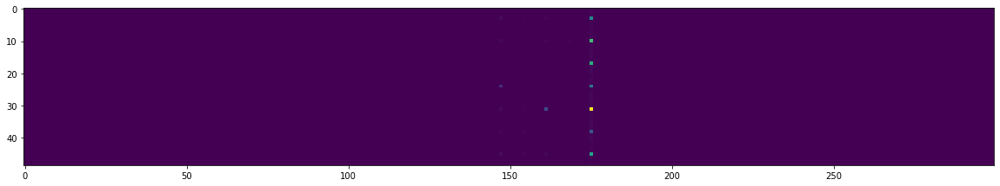

In [35]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

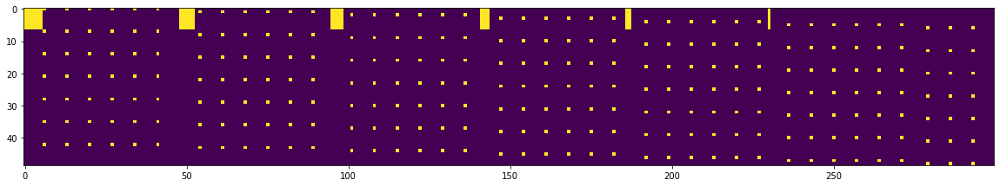

In [36]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

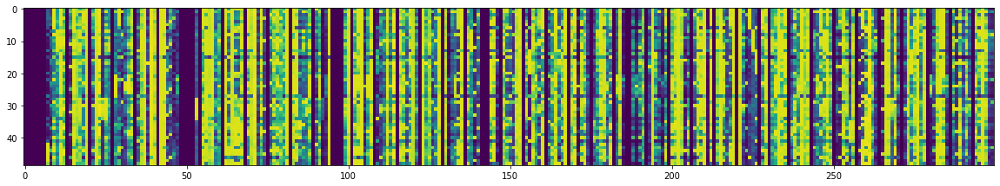

In [37]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

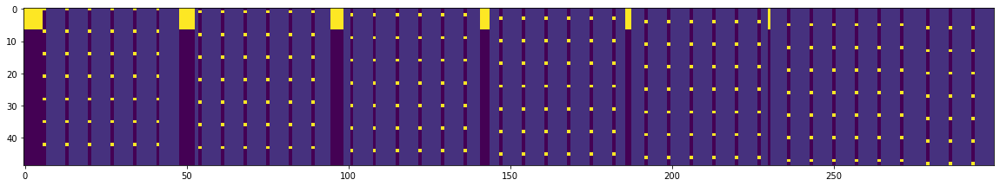

In [38]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

## Continue Training from checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2iwcafn1') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

In [ ]:
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=800, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

## Test after reloading checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2iwcafn1') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=300, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
#     callbacks=[checkpoint_callback]
)

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])